# NetworkX and Matplotlib; Human Dataset

Coefficient Threshold = 0.015625

# Concentric layout
- first approach: manually calculating node position, positioning nodes on concentric circles with nodes with higher degree centrality being assigned a smaller radius (closer to the center)
- different edge colors based on different modules

- this approach turned out to be less intepretable than using predeveloped layout algorithms -> therefore not implemented for developing further visualisations

Coefficient Threshold = 0.125

Number of nodes: 29
number of egdes:  87


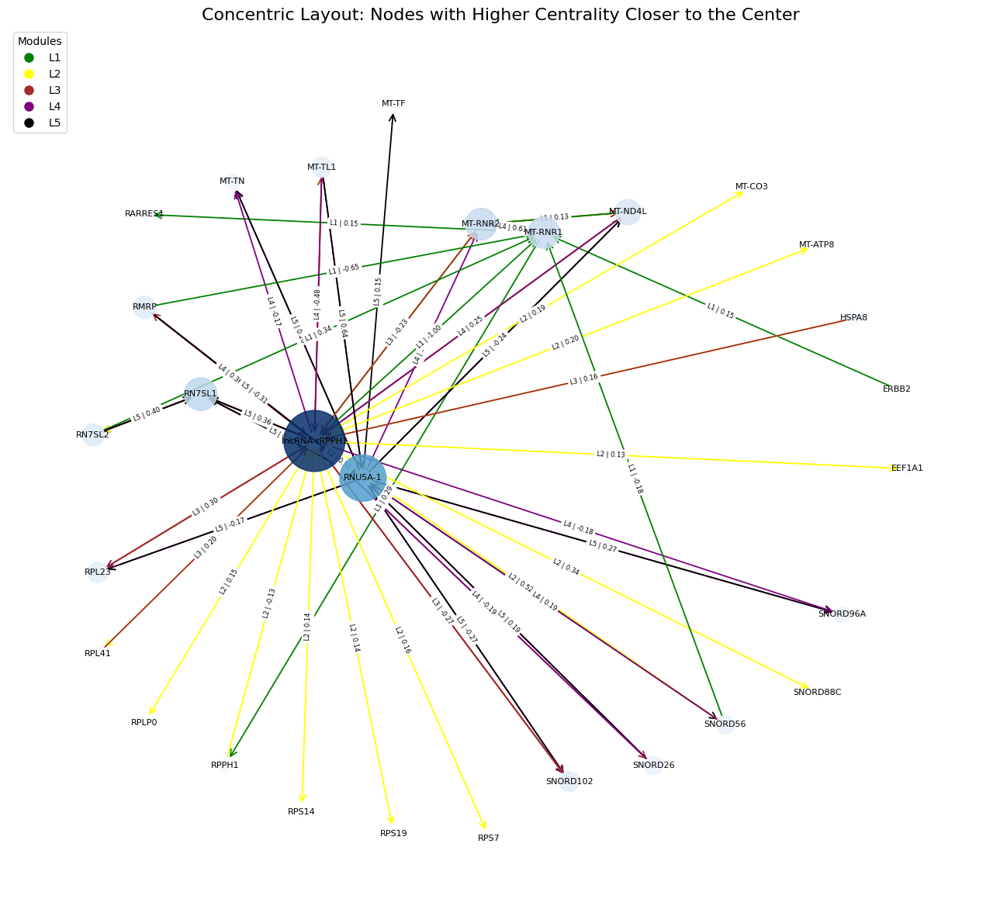

In [2]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

# Load CSV file
df = pd.read_csv("/Users/irmaskaljo/codedev/thesis/Data_preprocessing/Human_coronavirus/HS_consolidated_r5_t0.125.csv")

# Create directed graph
G = nx.MultiDiGraph()
for _, row in df.iterrows():
    G.add_edge(
        row["Regulator"],
        row["TargetGene"],
        module=row["Module"],
        weight=row["Weight"]
    )

# Calculate degree centrality
degree_centrality = nx.degree_centrality(G)

# Sort nodes by name for consistent circular layout
sorted_nodes = sorted(G.nodes())
num_nodes = len(sorted_nodes)
angle_step = 2 * np.pi / num_nodes

# Create concentric circle layout (nodes with higher centrality closer to center)
layout = {}
for i, node in enumerate(sorted_nodes):
    angle = i * angle_step
    degr_centrality = degree_centrality.get(node, 0)
    radius = 5 * (1 - degr_centrality) + 1  # Smaller radius = closer to center
    x = radius * np.cos(angle)
    y = radius * np.sin(angle)
    layout[node] = (x, y)

print(f"Number of nodes: {G.number_of_nodes()}")
# Node sizes and colors
node_sizes = [degree_centrality[n] * 2000 for n in G.nodes()]
node_colors = [degree_centrality[n] for n in G.nodes()]
module_colors = {
    "L1": "green",
    "L2": "yellow",
    "L3": "brown",
    "L4": "purple",
    "L5": "black"
}
edge_colors = [module_colors.get(data["module"], "gray") for _, _, data in G.edges(data=True)]

# Draw the graph
plt.figure(figsize=(13, 12))
nx.draw_networkx_nodes(
    G, pos=layout,
    node_size=node_sizes,
    node_color=node_colors,
    cmap=plt.cm.Blues,
    alpha=0.85
)
nx.draw_networkx_edges(
    G, pos=layout,
    edge_color=edge_colors,
    arrowstyle='->',
    arrowsize=15,
    width=1.3
)
nx.draw_networkx_labels(G, pos=layout, font_size=8)

# Edge labels
edge_labels = {
    (u, v): f"{d['module']} | {d['weight']:.2f}"
    for u, v, d in G.edges(data=True)
}
nx.draw_networkx_edge_labels(G, pos=layout, edge_labels=edge_labels, font_size=6)

# Add legend
handles = []
labels = []
for module, color in module_colors.items():
    handles.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10))
    labels.append(module)

plt.legend(handles=handles, labels=labels, title="Modules", loc="upper left", fontsize=10)
print("number of egdes: ", G.number_of_edges())
# Title and final adjustments
plt.title("Concentric Layout: Nodes with Higher Centrality Closer to the Center", fontsize=16)
plt.axis('off')
plt.tight_layout()
plt.show()


Number of nodes: 29


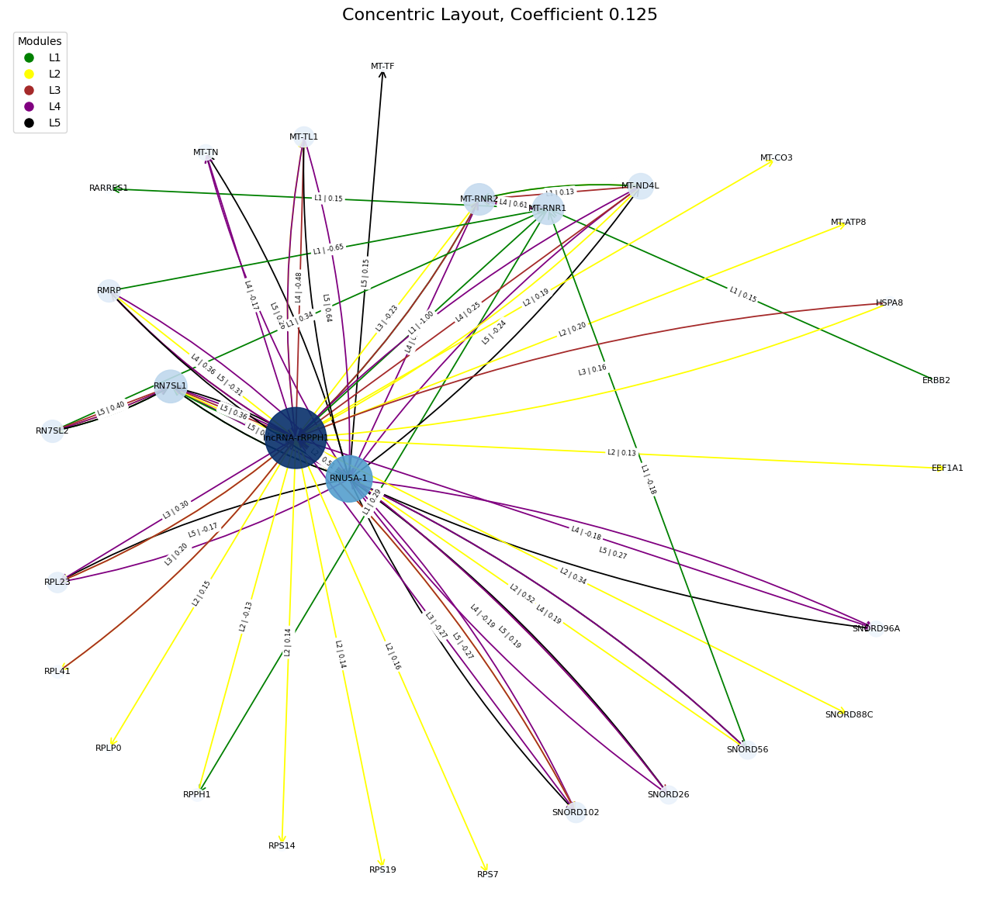

Number of edges in the graph: 87


In [3]:
# arced edges if there are multiple edges between nodes -> otherwise they overlap
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import FancyArrowPatch
from collections import defaultdict

# Load CSV file
df = pd.read_csv("//Users/irmaskaljo/codedev/thesis/Data_preprocessing/Human_coronavirus/HS_consolidated_r5_t0.125.csv")

# Create directed multigraph
G = nx.MultiDiGraph()
for _, row in df.iterrows():
    G.add_edge(
        row["Regulator"],
        row["TargetGene"],
        module=row["Module"],
        weight=row["Weight"]
    )

# Calculate degree centrality
degree_centrality = nx.degree_centrality(G)

# Sort nodes by name for consistent circular layout
sorted_nodes = sorted(G.nodes())
num_nodes = len(sorted_nodes)
angle_step = 2 * np.pi / num_nodes

# Create concentric layout
layout = {}
for i, node in enumerate(sorted_nodes):
    angle = i * angle_step
    centrality = degree_centrality.get(node, 0)
    radius = 5 * (1 - centrality) + 1  # Closer to center if higher centrality
    x = radius * np.cos(angle)
    y = radius * np.sin(angle)
    layout[node] = (x, y)

print(f"Number of nodes: {G.number_of_nodes()}")

# Node sizes and colors
node_sizes = [degree_centrality[n] * 2000 for n in G.nodes()]
node_colors = [degree_centrality[n] for n in G.nodes()]
module_colors = {
    "L1": "green",
    "L2": "yellow",
    "L3": "brown",
    "L4": "purple",
    "L5": "black"
}

# === Build curvature map for duplicate edges ===
edge_pair_counts = defaultdict(int)
for u, v in G.edges():
    key = tuple(sorted((u, v)))
    edge_pair_counts[key] += 1

edge_drawn_count = defaultdict(int)

# === Draw graph ===
fig, ax = plt.subplots(figsize=(13, 12))

# Draw nodes
nx.draw_networkx_nodes(
    G, pos=layout,
    node_size=node_sizes,
    node_color=node_colors,
    cmap=plt.cm.Blues,
    alpha=0.9,
    ax=ax
)
nx.draw_networkx_labels(G, pos=layout, font_size=8, ax=ax)

# Draw arced edges with color
for u, v, data in G.edges(data=True):
    key = tuple(sorted((u, v)))
    count = edge_pair_counts[key]
    index = edge_drawn_count[key]

    if count == 1:
        rad = 0.0
    else:
        spread = np.linspace(-0.08, 0.08, count)
        rad = spread[index]

    edge_drawn_count[key] += 1

    color = module_colors.get(data["module"], "gray")

    arrow = FancyArrowPatch(
        posA=layout[u],
        posB=layout[v],
        arrowstyle='->',
        color=color,
        lw=1.3,
        mutation_scale=15,
        connectionstyle=f'arc3,rad={rad}'
    )
    ax.add_patch(arrow)

# Optional: Edge labels
edge_labels = {
    (u, v): f"{d['module']} | {d['weight']:.2f}"
    for u, v, d in G.edges(data=True)
}
nx.draw_networkx_edge_labels(G, pos=layout, edge_labels=edge_labels, font_size=6, ax=ax)

# Add legend
handles = []
labels = []
for module, color in module_colors.items():
    handles.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10))
    labels.append(module)

plt.legend(handles=handles, labels=labels, title="Modules", loc="upper left", fontsize=10)

# Final plot cleanup
plt.title("Concentric Layout, Coefficient 0.125", fontsize=16)
plt.axis('off')
plt.tight_layout()
plt.show()

print("Number of edges in the graph:", G.number_of_edges())


In [4]:
# number of rows in df
print(f"Number of rows in DataFrame: {len(df)}")

Number of rows in DataFrame: 87


Coefficient Threshold = 0.015625

Number of nodes: 162


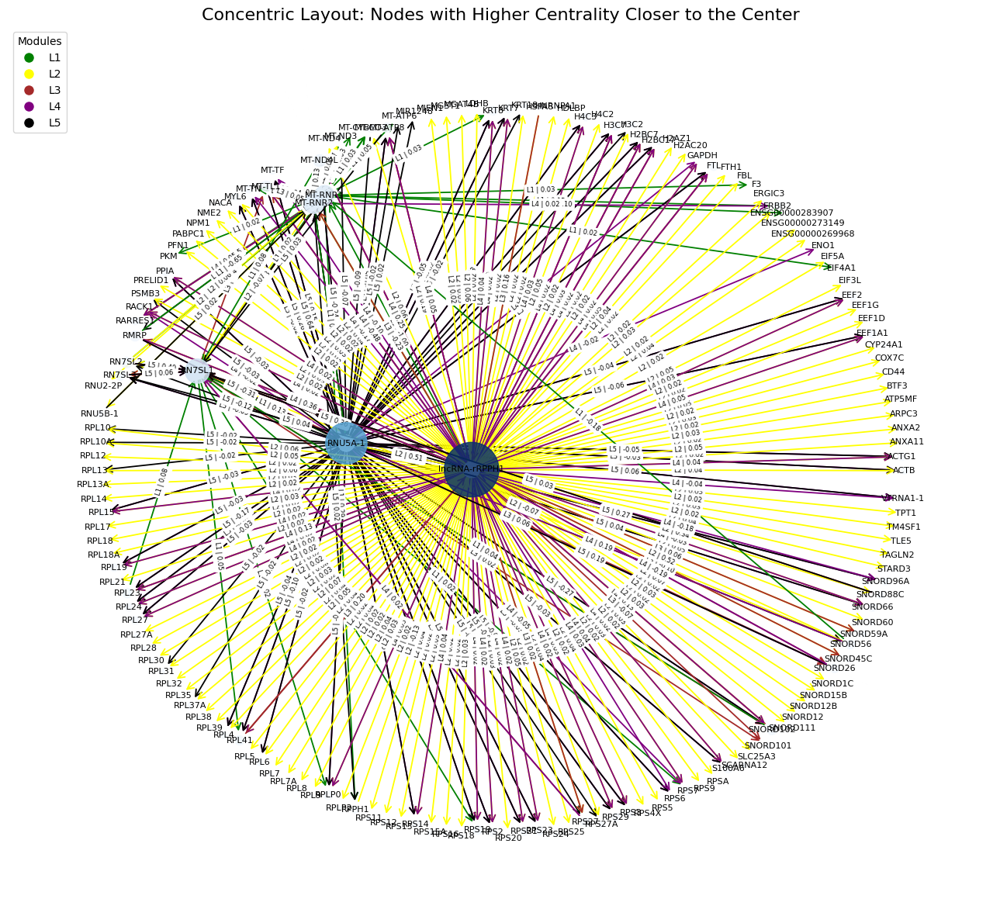

Number of edges in the graph: 392


In [5]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

# Load CSV file
df = pd.read_csv("/Users/irmaskaljo/codedev/thesis/Data_preprocessing/Human_coronavirus/HS_consolidated_r5_t0.015625.csv")

# Create directed multigraph
G = nx.MultiDiGraph()
for _, row in df.iterrows():
    G.add_edge(
        row["Regulator"],
        row["TargetGene"],
        module=row["Module"],
        weight=row["Weight"]
    )

# Calculate degree centrality
degree_centrality = nx.degree_centrality(G)

# Sort nodes by name for consistent circular layout
sorted_nodes = sorted(G.nodes())
num_nodes = len(sorted_nodes)
angle_step = 2 * np.pi / num_nodes

# Create concentric circle layout (nodes with higher centrality closer to center)
layout = {}
for i, node in enumerate(sorted_nodes):
    angle = i * angle_step
    degr_centrality = degree_centrality.get(node, 0)
    radius = 5 * (1 - degr_centrality) + 1  # Smaller radius = closer to center
    x = radius * np.cos(angle)
    y = radius * np.sin(angle)
    layout[node] = (x, y)

print(f"Number of nodes: {G.number_of_nodes()}")

# Node sizes and colors
node_sizes = [degree_centrality[n] * 2000 for n in G.nodes()]
node_colors = [degree_centrality[n] for n in G.nodes()]
module_colors = {
    "L1": "green",
    "L2": "yellow",
    "L3": "brown",
    "L4": "purple",
    "L5": "black"
}
edge_colors = [module_colors.get(data["module"], "gray") for _, _, data in G.edges(data=True)]

# Draw the graph
plt.figure(figsize=(13, 12))
nx.draw_networkx_nodes(
    G, pos=layout,
    node_size=node_sizes,
    node_color=node_colors,
    cmap=plt.cm.Blues,
    alpha=0.85
)
nx.draw_networkx_edges(
    G, pos=layout,
    edge_color=edge_colors,
    arrowstyle='->',
    arrowsize=15,
    width=1.3
)
nx.draw_networkx_labels(G, pos=layout, font_size=8)

# Edge labels
edge_labels = {
    (u, v): f"{d['module']} | {d['weight']:.2f}"
    for u, v, d in G.edges(data=True)
}
nx.draw_networkx_edge_labels(G, pos=layout, edge_labels=edge_labels, font_size=6)

# Add legend
handles = []
labels = []
for module, color in module_colors.items():
    handles.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10))
    labels.append(module)

plt.legend(handles=handles, labels=labels, title="Modules", loc="upper left", fontsize=10)

# Title and final adjustments
plt.title("Concentric Layout: Nodes with Higher Centrality Closer to the Center", fontsize=16)
plt.axis('off')
plt.tight_layout()
plt.show()
print("Number of edges in the graph:", G.number_of_edges())


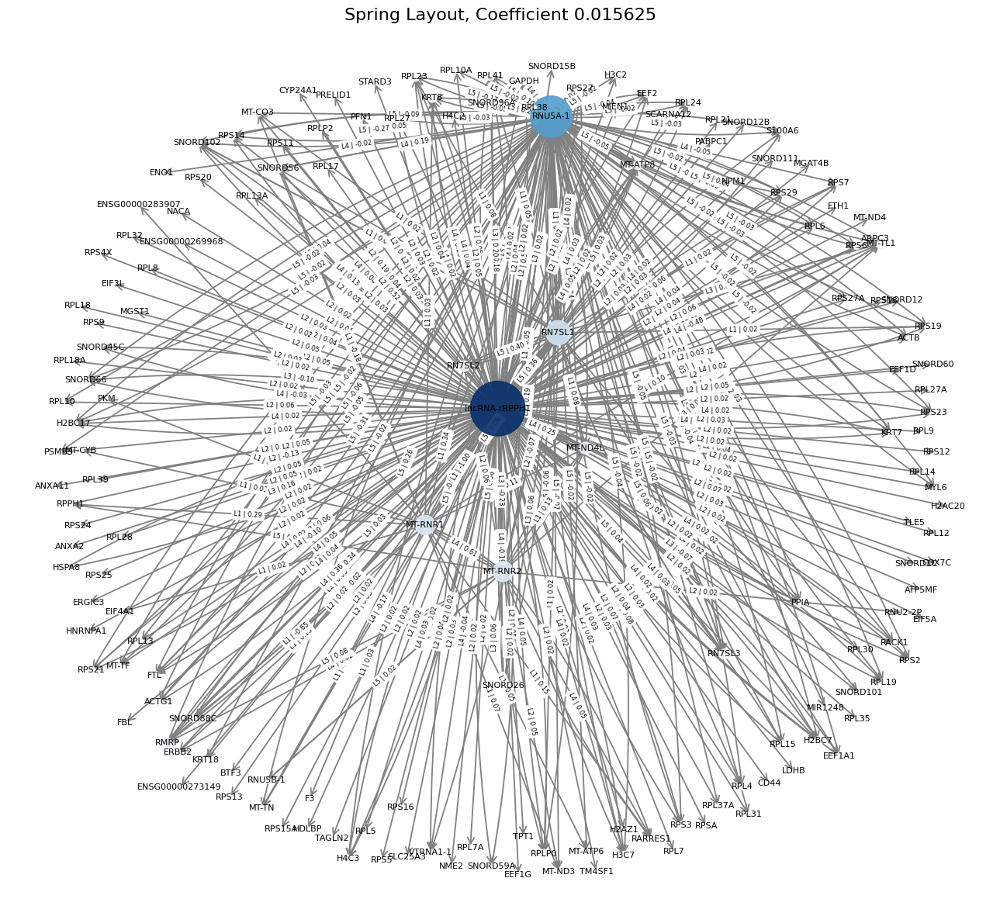

Number of nodes: 162
Number of edges: 392


In [6]:
# using spring layout instead of calculating node positions manually
# example of a very cluttered graph

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import FancyArrowPatch
from collections import defaultdict

# Load CSV file
df = pd.read_csv("/Users/irmaskaljo/codedev/thesis/Data_preprocessing/Human_coronavirus/HS_consolidated_r5_t0.015625.csv") 

# Create directed multigraph
G = nx.MultiDiGraph()
for _, row in df.iterrows():
    G.add_edge(
        row["Regulator"],
        row["TargetGene"],
        module=row["Module"],
        weight=row["Weight"]
    )

# Compute degree centrality
degree_centrality = nx.degree_centrality(G)

# Compute spring layout
layout = nx.spring_layout(G, k=0.5, seed=42)  # k adjusts spacing; seed for reproducibility

# Node sizes and colors
node_sizes = [degree_centrality[n] * 2000 for n in G.nodes()]
node_colors = [degree_centrality[n] for n in G.nodes()]
module_colors = {
    "L1": "green",
    "L2": "yellow",
    "L3": "brown",
    "L4": "purple",
    "L5": "black"
}

# Handle multiple edges
edge_pair_counts = defaultdict(int)
for u, v in G.edges():
    key = (u, v)  # keep directed tuple since it's MultiDiGraph
    edge_pair_counts[key] += 1

edge_drawn_count = defaultdict(int)

# Plot
fig, ax = plt.subplots(figsize=(13, 12))

# Draw nodes
nx.draw_networkx_nodes(
    G, pos=layout,
    node_size=node_sizes,
    node_color=node_colors,
    cmap=plt.cm.Blues,
    alpha=0.9,
    ax=ax
)
nx.draw_networkx_labels(G, pos=layout, font_size=8, ax=ax)



# === Draw arced directed edges (all in same color) ===
for u, v, data in G.edges(data=True):
    key = (u, v)
    count = edge_pair_counts[key]
    index = edge_drawn_count[key]

    rad = 0.0 if count == 1 else np.linspace(-0.08, 0.08, count)[index]
    edge_drawn_count[key] += 1

    arrow = FancyArrowPatch(
        posA=layout[u],
        posB=layout[v],
        arrowstyle='->',
        color="gray",  # Use the same color for all edges
        lw=1.3,
        mutation_scale=15,
        connectionstyle=f'arc3,rad={rad}'
    )
    ax.add_patch(arrow)


# Edge labels
edge_labels = {
    (u, v): f"{d['module']} | {d['weight']:.2f}"
    for u, v, d in G.edges(data=True)
}
nx.draw_networkx_edge_labels(G, pos=layout, edge_labels=edge_labels, font_size=6, ax=ax)


# Final plot cleanup
plt.title("Spring Layout, Coefficient 0.015625", fontsize=16)
plt.axis('off')
plt.tight_layout()
plt.show()

print("Number of nodes:", G.number_of_nodes())
print("Number of edges:", G.number_of_edges())


## radial Layout from Graphviz
- "twopi"
- multi - module interactions are showed with one edge only and module names written as edge labels

Coefficient threshold = 0.125

In [8]:
!pip install pygraphviz

  Using cached pygraphviz-1.14-cp313-cp313-macosx_15_0_arm64.whl

[notice] A new release of pip is available: 25.1.1 -> 25.2
[notice] To update, run: pip install --upgrade pip


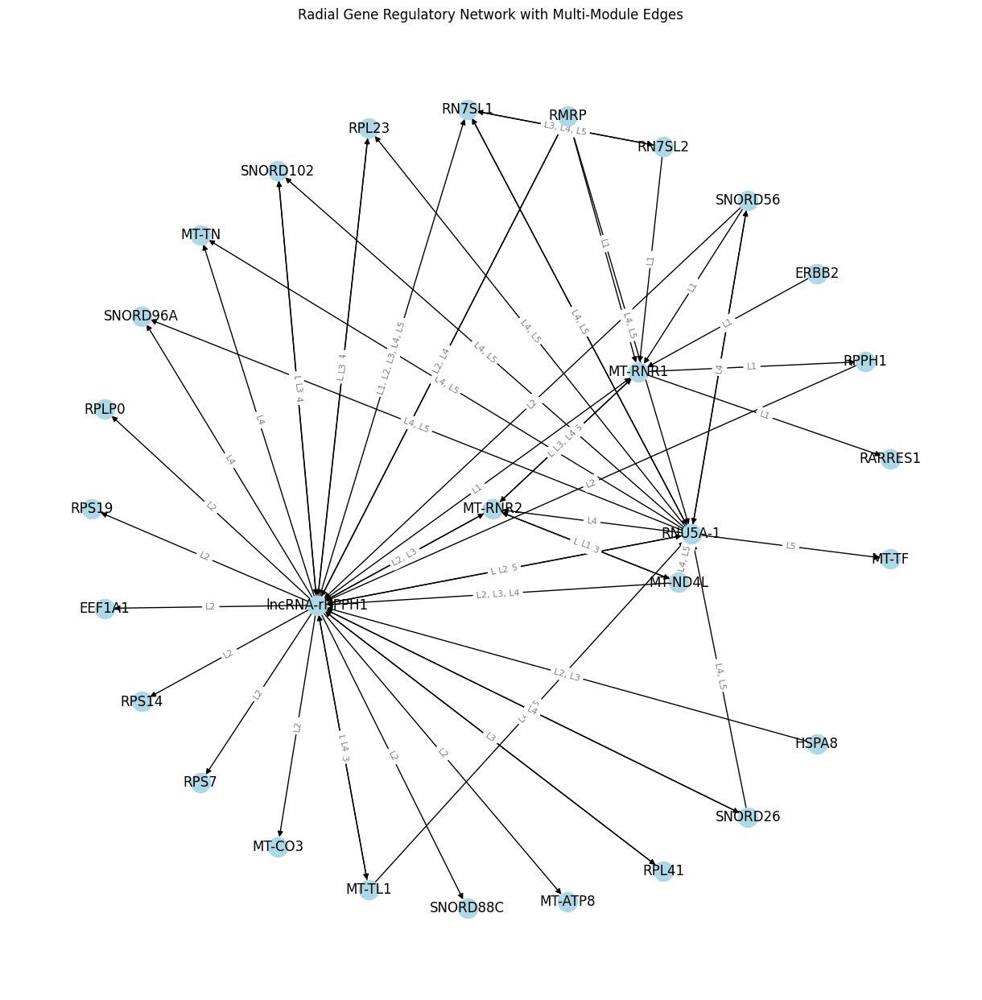

In [9]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from networkx.drawing.nx_agraph import graphviz_layout
from collections import defaultdict

# Load data
df = pd.read_csv('/Users/irmaskaljo/codedev/thesis/Data_preprocessing/Human_coronavirus/HS_consolidated_r5_t0.125.csv')

# Create directed graph
G = nx.DiGraph()

# Collect modules per (Regulator, TargetGene) pair
edge_modules = defaultdict(set)

for _, row in df.iterrows():
    u = row["Regulator"]
    v = row["TargetGene"]
    module = row["Module"]
    edge_modules[(u, v)].add(module)

# Add edges with module info
for (u, v), modules in edge_modules.items():
    G.add_edge(u, v, modules=", ".join(sorted(modules)))

sources = [n for n in G.nodes if G.in_degree(n) == 0]
# pick the one with highest out-degree among them


# Layout
pos = graphviz_layout(G, prog="twopi")

# Draw graph
plt.figure(figsize=(12, 12))
nx.draw(G, pos, with_labels=True, node_size=300, node_color="lightblue", arrows=True)

# Add edge labels (modules)
edge_labels = {(u, v): d["modules"] for u, v, d in G.edges(data=True)}
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=8, font_color="gray")

plt.title("Radial Gene Regulatory Network with Multi-Module Edges")
plt.axis("off")
#plt.tight_layout()
plt.show()


Coefficient Threshold = 0.015625

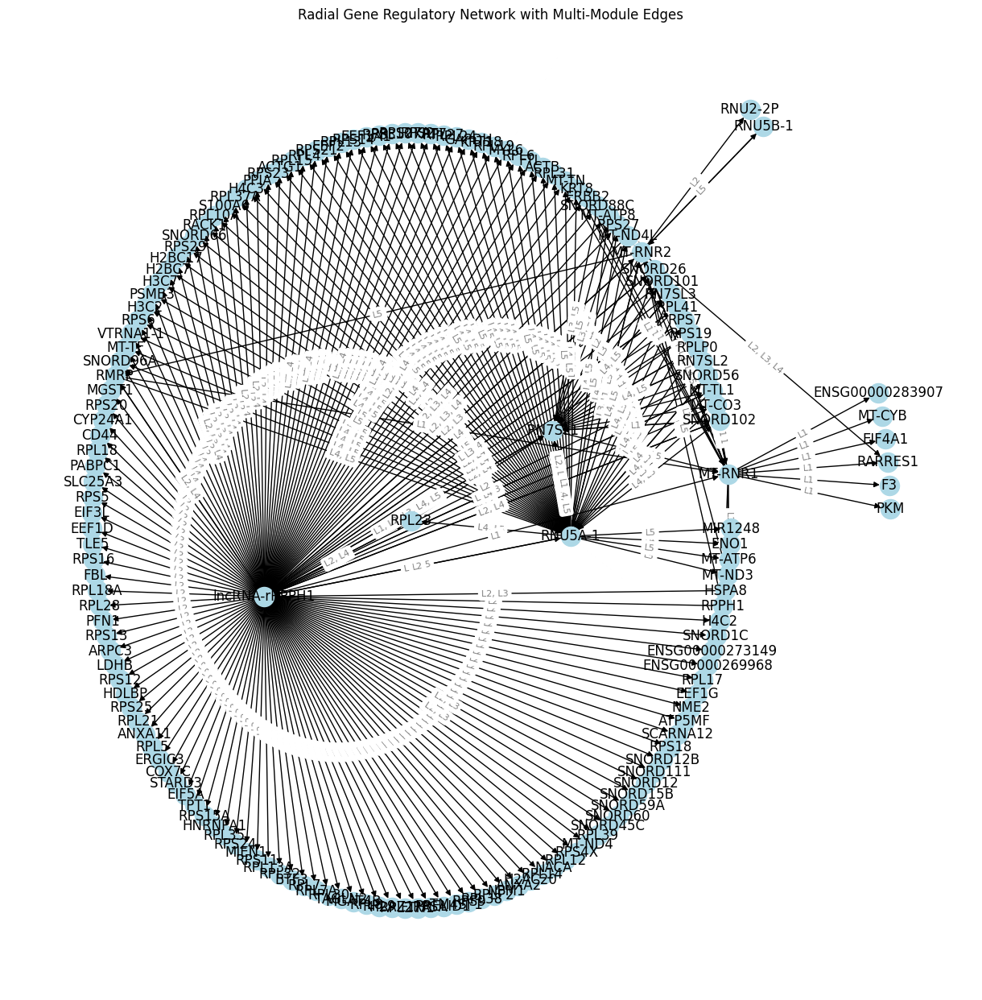

In [10]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from networkx.drawing.nx_agraph import graphviz_layout
from collections import defaultdict

# Load data
df = pd.read_csv('/Users/irmaskaljo/codedev/thesis/Data_preprocessing/Human_coronavirus/HS_consolidated_r5_t0.015625.csv')

# Create directed graph
G = nx.DiGraph()

# Collect modules per (Regulator, TargetGene) pair
edge_modules = defaultdict(set)

for _, row in df.iterrows():
    u = row["Regulator"]
    v = row["TargetGene"]
    module = row["Module"]
    edge_modules[(u, v)].add(module)

# Add edges with module info
for (u, v), modules in edge_modules.items():
    G.add_edge(u, v, modules=", ".join(sorted(modules)))

sources = [n for n in G.nodes if G.in_degree(n) == 0]
# pick the one with highest out-degree among them


# Layout
pos = graphviz_layout(G, prog="twopi")

# Draw graph
plt.figure(figsize=(12, 12))
nx.draw(G, pos, with_labels=True, node_size=300, node_color="lightblue", arrows=True)

# Add edge labels (modules)
edge_labels = {(u, v): d["modules"] for u, v, d in G.edges(data=True)}
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=8, font_color="gray")

plt.title("Radial Gene Regulatory Network with Multi-Module Edges")
plt.axis("off")
#plt.tight_layout()
plt.show()


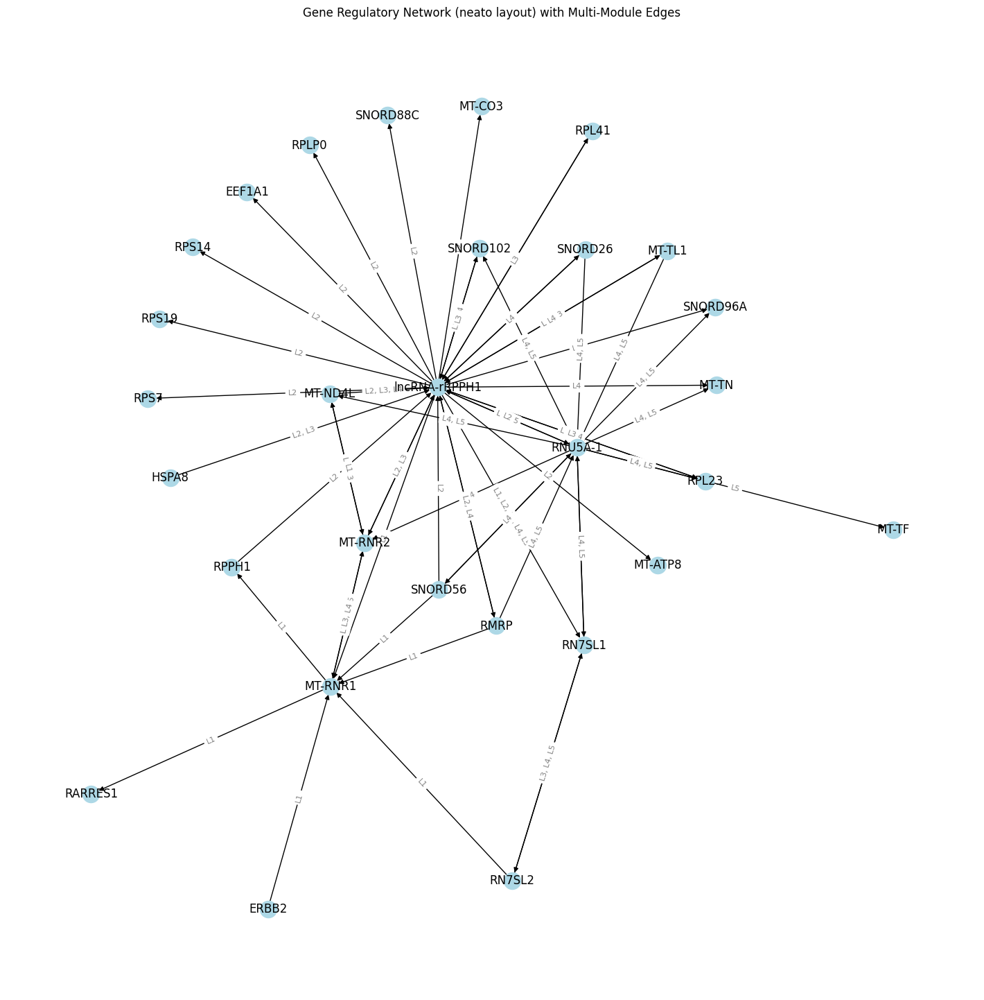

In [11]:
# trying out neato layout for a different visualization style, coefficient 0.125
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from networkx.drawing.nx_agraph import graphviz_layout
from collections import defaultdict

# Load data
df = pd.read_csv('/Users/irmaskaljo/codedev/thesis/Data_preprocessing/Human_coronavirus/HS_consolidated_r5_t0.125.csv')

# Create directed graph
G = nx.DiGraph()

# Collect modules per (Regulator, TargetGene) pair
edge_modules = defaultdict(set)

for _, row in df.iterrows():
    u = row["Regulator"]
    v = row["TargetGene"]
    module = row["Module"]
    edge_modules[(u, v)].add(module)

# Add edges with module info
for (u, v), modules in edge_modules.items():
    G.add_edge(u, v, modules=", ".join(sorted(modules)))

# Layout using neato
pos = graphviz_layout(G, prog="neato")

# Draw graph
plt.figure(figsize=(14, 14))
nx.draw(G, pos, with_labels=True, node_size=300, node_color="lightblue", arrows=True)

# Add edge labels (modules)
edge_labels = {(u, v): d["modules"] for u, v, d in G.edges(data=True)}
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=8, font_color="gray")

plt.title("Gene Regulatory Network (neato layout) with Multi-Module Edges")
plt.axis("off")
plt.show()



- majority counting of modules -> counting for each node how often each module appears in it's interaction -> assigning color based on the dominant module

- this can be misleading because for example, if a node has 10 interactions in module 1 and 11 in module 2, module 2 will be the dominant module and the node will get the color of module 2 -> therefore this approach was not considered further

- hovever,  this approach helped spot that there are many terminal nodes,  which are all being regulated by the same gene in the same module

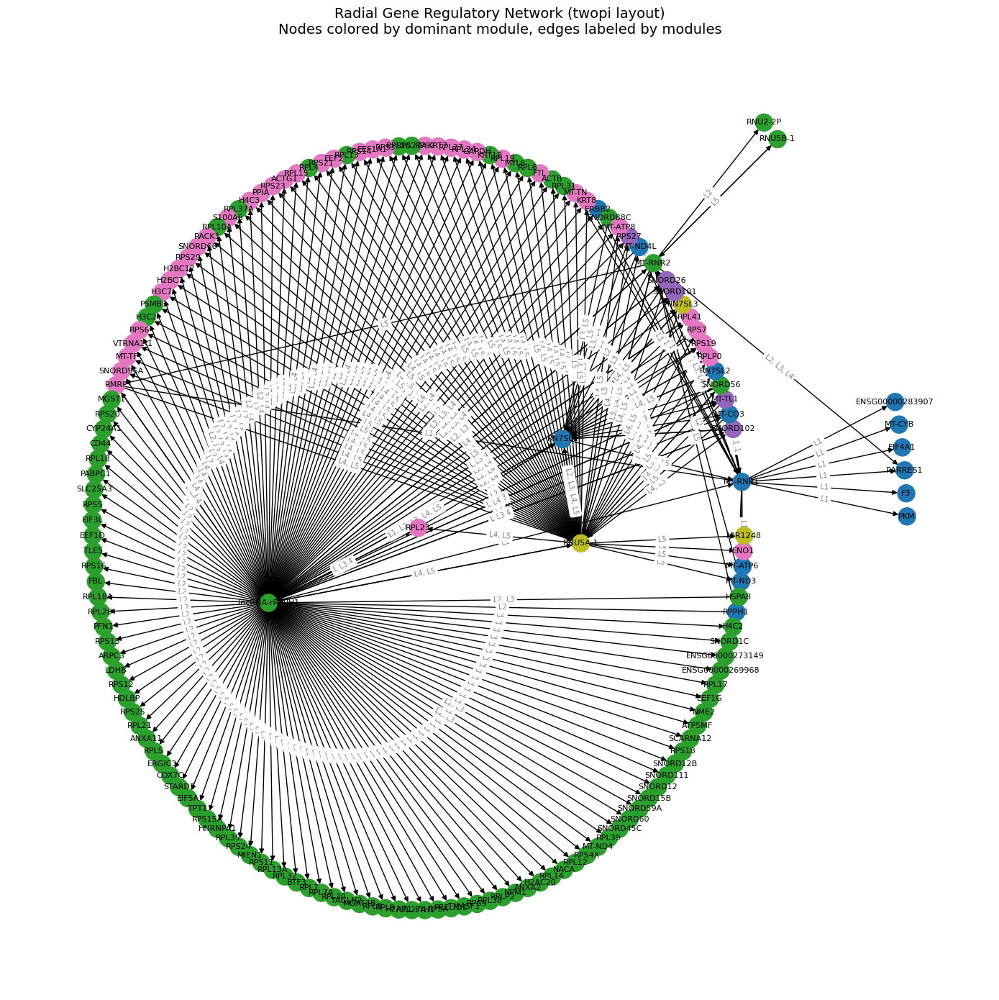

In [12]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict, Counter
from networkx.drawing.nx_agraph import graphviz_layout  # Requires pygraphviz

# Load data
df = pd.read_csv('/Users/irmaskaljo/codedev/thesis/Data_preprocessing/Human_coronavirus/HS_consolidated_r5_t0.015625.csv')

# Create directed graph
G = nx.DiGraph()

# Store module info for nodes and edges
node_modules = defaultdict(list)
edge_modules = defaultdict(set)

# Build graph and collect module info
for _, row in df.iterrows():
    u = row["Regulator"]
    v = row["TargetGene"]
    module = row["Module"]
    
    G.add_edge(u, v)
    edge_modules[(u, v)].add(module)
    
    node_modules[u].append(module)
    node_modules[v].append(module)

# Assign each node to its dominant module
node_cluster = {
    node: Counter(modules).most_common(1)[0][0]
    for node, modules in node_modules.items()
}

# Color mapping for modules
unique_modules = sorted(set(node_cluster.values()))
color_map = {mod: plt.cm.tab20(i / len(unique_modules)) for i, mod in enumerate(unique_modules)}
node_colors = [color_map[node_cluster[node]] for node in G.nodes()]

# Radial layout with Graphviz (twopi)
pos = graphviz_layout(G, prog="twopi")

# Draw nodes and edges
plt.figure(figsize=(14, 14))
nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=300)
nx.draw_networkx_edges(G, pos, arrows=True, arrowstyle='-|>', arrowsize=10)
nx.draw_networkx_labels(G, pos, font_size=8)

# Draw module labels on edges
edge_labels = {
    (u, v): ", ".join(sorted(mods))
    for (u, v), mods in edge_modules.items()
}
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=7, font_color="gray")

# Final display tweaks
plt.title("Radial Gene Regulatory Network (twopi layout)\nNodes colored by dominant module, edges labeled by modules", fontsize=14)
plt.axis("off")
plt.tight_layout()
plt.show()


Here terminal nodes were grouped if they had a directed edge stemming from the same node in the same module -> gene names shown in squares

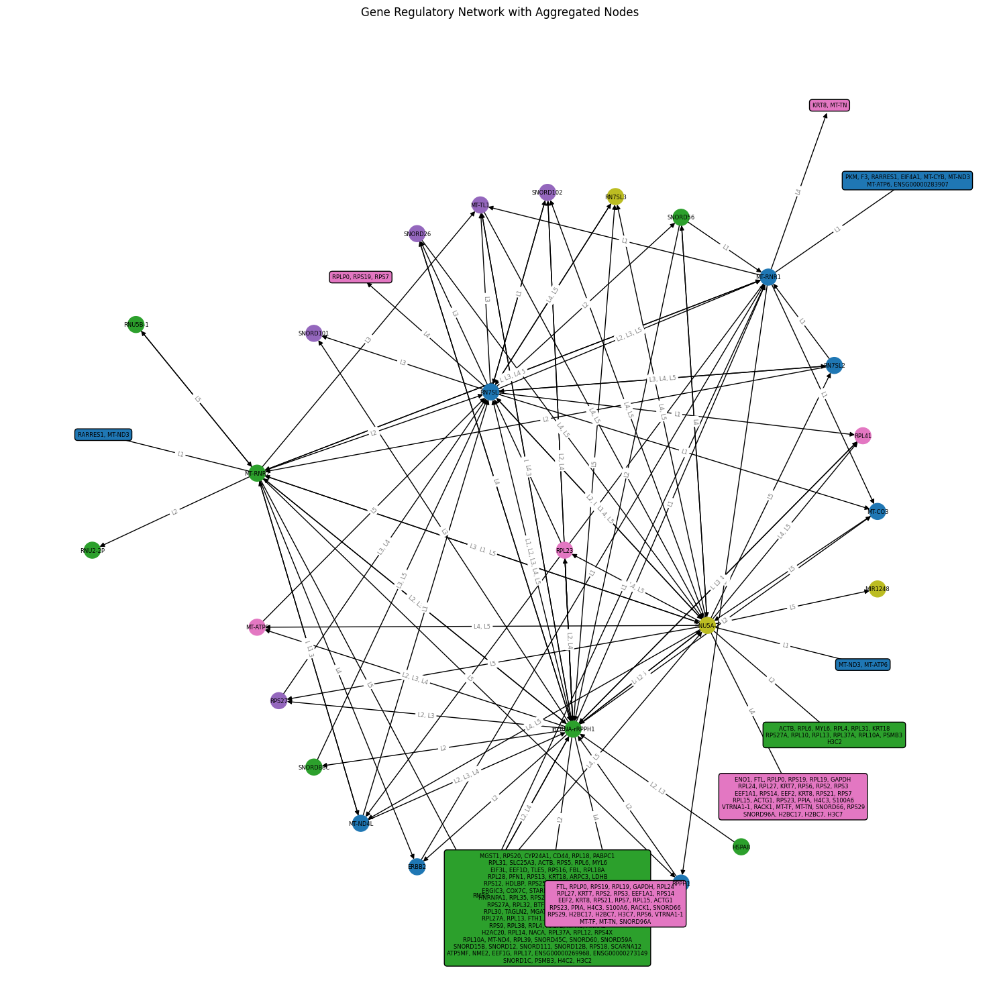

In [13]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict, Counter
from textwrap import wrap
from networkx.drawing.nx_agraph import graphviz_layout

# Load data
df = pd.read_csv('/Users/irmaskaljo/codedev/thesis/Data_preprocessing/Human_coronavirus/HS_consolidated_r5_t0.015625.csv')

# Build full graph
G_full = nx.DiGraph()
node_modules = defaultdict(list)
edge_modules = defaultdict(set)

for _, row in df.iterrows():
    u = row["Regulator"]
    v = row["TargetGene"]
    module = row["Module"]

    G_full.add_edge(u, v)
    edge_modules[(u, v)].add(module)

    node_modules[u].append(module)
    node_modules[v].append(module)

# Dominant module per node
node_cluster = {
    node: Counter(mods).most_common(1)[0][0]
    for node, mods in node_modules.items()
}

# Terminal nodes
terminal_nodes = [n for n in G_full.nodes() if G_full.out_degree(n) == 0]

# Group terminal nodes by (regulator, module)
grouped_targets = defaultdict(list)
for u, v in G_full.edges():
    if v in terminal_nodes:
        mod = node_cluster[v]
        grouped_targets[(u, mod)].append(v)

# Create simplified graph
G = nx.DiGraph()
new_node_cluster = {}
new_edge_modules = {}
supernodes = {}
supernode_module = {}

for u, v in G_full.edges():
    if v in terminal_nodes:
        continue
    G.add_edge(u, v)
    new_edge_modules[(u, v)] = edge_modules[(u, v)]
    new_node_cluster[u] = node_cluster[u]
    new_node_cluster[v] = node_cluster[v]

for (reg, mod), targets in grouped_targets.items():
    if len(targets) == 1:
        v = targets[0]
        G.add_edge(reg, v)
        new_edge_modules[(reg, v)] = edge_modules[(reg, v)]
        new_node_cluster[reg] = node_cluster[reg]
        new_node_cluster[v] = node_cluster[v]
    else:
        supernode = f"group_{reg}_{mod}"
        G.add_edge(reg, supernode)
        new_edge_modules[(reg, supernode)] = {mod}
        new_node_cluster[reg] = node_cluster[reg]
        new_node_cluster[supernode] = mod
        supernodes[supernode] = targets
        supernode_module[supernode] = mod

# Color map
unique_modules = sorted(set(new_node_cluster.values()))
color_map = {mod: plt.cm.tab20(i / len(unique_modules)) for i, mod in enumerate(unique_modules)}

# Layout
pos = graphviz_layout(G, prog="twopi")
plt.figure(figsize=(15, 15))

# Draw regular nodes
regular_nodes = [n for n in G.nodes() if n not in supernodes]
nx.draw_networkx_nodes(
    G, pos,
    nodelist=regular_nodes,
    node_color=[color_map[new_node_cluster[n]] for n in regular_nodes],
    node_shape='o',
    node_size=300
)


# Draw edges
nx.draw_networkx_edges(G, pos, arrows=True, arrowstyle='-|>', arrowsize=10)

# Draw supernodes as annotations with square box and wrapped text
for n, genes in supernodes.items():
    x, y = pos[n]
    mod = supernode_module[n]
    color = color_map[mod]

    # Wrap gene list into lines (e.g. 6 genes per line)
    wrap_width = 6
    wrapped_label = "\n".join([", ".join(genes[i:i+wrap_width]) for i in range(0, len(genes), wrap_width)])

    plt.annotate(
        wrapped_label,
        xy=(x, y),
        ha='center',
        va='center',
        fontsize=6,
        bbox=dict(
            boxstyle="round,pad=0.5",
            facecolor=color,
            edgecolor='black'
        )
    )

# Labels for regular nodes
labels = {n: n for n in regular_nodes}
nx.draw_networkx_labels(G, pos, labels=labels, font_size=6)

# Edge labels
edge_labels = {
    (u, v): ", ".join(sorted(mods))
    for (u, v), mods in new_edge_modules.items()
}
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=6, font_color="gray")

# Final plot
plt.title("Gene Regulatory Network with Aggregated Nodes", fontsize=12)
plt.axis("off")
plt.tight_layout()
plt.show()


Problem with overlapping squares -> solution: showing nodes with smaller squares and writing gene names as a legend

-> later this approach was implemented combined with different edge colors for different modules (instead of node coloring)

Number of edges in the final graph: 96
Number of terminal nodes: 139


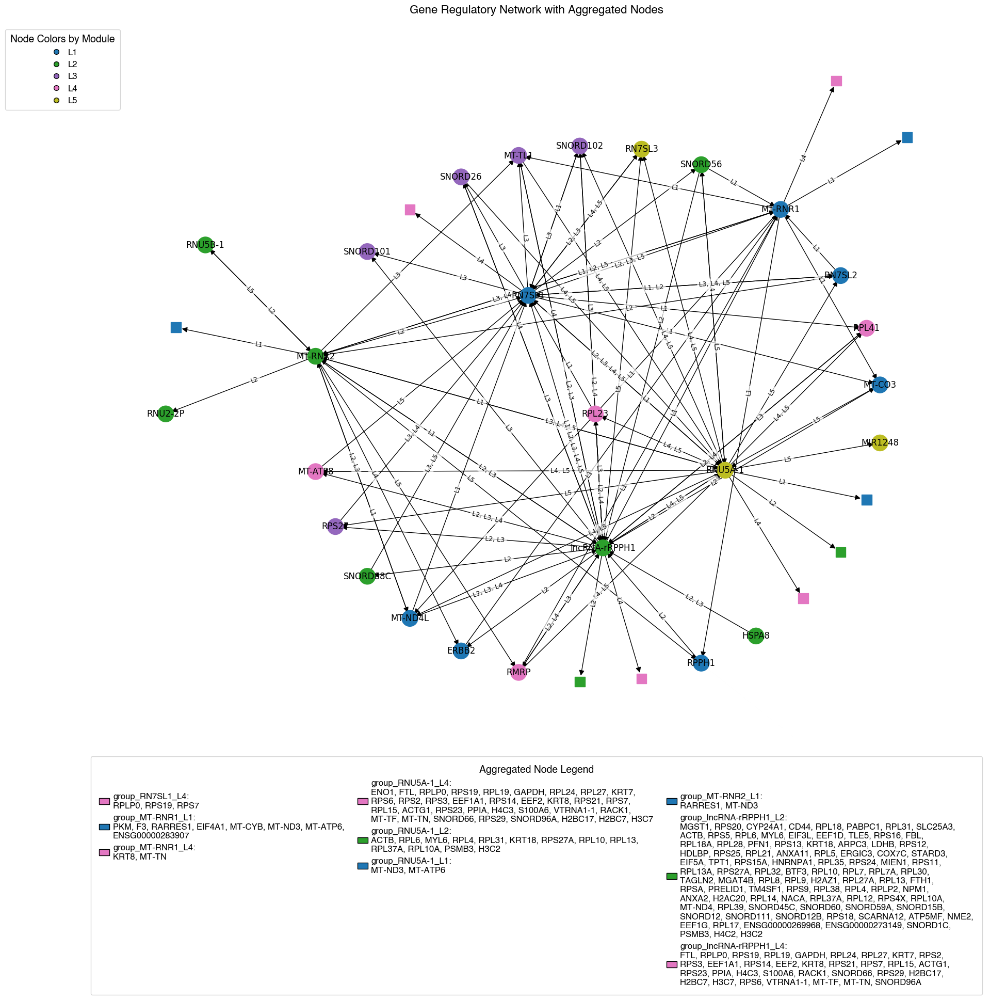

In [14]:
# Final version
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict, Counter
from networkx.drawing.nx_agraph import graphviz_layout
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
import textwrap
import matplotlib.gridspec as gridspec

# === Helvetica font settings ===
font_helvetica = {'fontname': 'Helvetica'}
legend_title_font = {'family': 'Helvetica', 'weight': 'bold', 'size': 14}
legend_text_font = {'family': 'Helvetica', 'size':12 }

# === Load Data ===
df = pd.read_csv('/Users/irmaskaljo/codedev/thesis/Data_preprocessing/Human_coronavirus/HS_consolidated_r5_t0.015625.csv')

# === Build Full Graph ===
G_full = nx.DiGraph()
node_modules = defaultdict(list)
edge_modules = defaultdict(set)

for _, row in df.iterrows():
    u, v, mod = row["Regulator"], row["TargetGene"], row["Module"]
    G_full.add_edge(u, v)
    edge_modules[(u, v)].add(mod)
    node_modules[u].append(mod)
    node_modules[v].append(mod)

# === Assign Dominant Module ===
node_cluster = {n: Counter(mods).most_common(1)[0][0] for n, mods in node_modules.items()}
terminal_nodes = [n for n in G_full.nodes() if G_full.out_degree(n) == 0]

# === Group Terminal Nodes ===
grouped_targets = defaultdict(list)
for u, v in G_full.edges():
    if v in terminal_nodes:
        grouped_targets[(u, node_cluster[v])].append(v)

# === Build Simplified Graph ===
G = nx.DiGraph()
new_node_cluster = {}
new_edge_modules = {}
supernodes = {}
supernode_module = {}

for u, v in G_full.edges():
    if v in terminal_nodes:
        continue
    G.add_edge(u, v)
    new_edge_modules[(u, v)] = edge_modules[(u, v)]
    new_node_cluster[u] = node_cluster[u]
    new_node_cluster[v] = node_cluster[v]

for (reg, mod), targets in grouped_targets.items():
    if len(targets) == 1:
        v = targets[0]
        G.add_edge(reg, v)
        new_edge_modules[(reg, v)] = edge_modules[(reg, v)]
        new_node_cluster[reg] = node_cluster[reg]
        new_node_cluster[v] = node_cluster[v]
    else:
        sn = f"group_{reg}_{mod}"
        G.add_edge(reg, sn)
        new_edge_modules[(reg, sn)] = {mod}
        new_node_cluster[reg] = node_cluster[reg]
        new_node_cluster[sn] = mod
        supernodes[sn] = targets
        supernode_module[sn] = mod

# === Color Map ===
unique_modules = sorted(set(new_node_cluster.values()))
color_map = {mod: plt.cm.tab20(i / len(unique_modules)) for i, mod in enumerate(unique_modules)}

# === Prepare Legends ===
supernode_list = list(supernodes)
supernode_patches = []
supernode_labels = []

for sn in supernode_list:
    mod = supernode_module[sn]
    color = color_map[mod]
    genes = supernodes[sn]
    wrapped = "\n".join(textwrap.wrap(", ".join(genes), width=60))
    supernode_patches.append(Patch(facecolor=color, edgecolor='black'))
    supernode_labels.append(f"{sn}:\n{wrapped}")

module_patches = [
    Line2D([0], [0], marker='o', color='w',
           markerfacecolor=color_map[mod], markeredgecolor='black',
           markersize=7, label=mod)
    for mod in unique_modules
]

# === Layout ===
pos = graphviz_layout(G, prog="twopi")

# === Create figure ===
fig = plt.figure(figsize=(20, 22))
gs = gridspec.GridSpec(2, 1, height_ratios=[7, 1])

# === Graph panel ===
ax_graph = plt.subplot(gs[0])
regular_nodes = [n for n in G.nodes() if n not in supernodes]

nx.draw_networkx_nodes(G, pos, nodelist=regular_nodes,
                       node_color=[color_map[new_node_cluster[n]] for n in regular_nodes],
                       node_shape='o', node_size=500, ax=ax_graph)

nx.draw_networkx_nodes(G, pos, nodelist=supernode_list,
                       node_color=[color_map[supernode_module[n]] for n in supernode_list],
                       node_shape='s', node_size=200, ax=ax_graph)

nx.draw_networkx_labels(G, pos, labels={n: n for n in regular_nodes},
                        font_size=12, ax=ax_graph)

nx.draw_networkx_edges(G, pos, ax=ax_graph, arrows=True,
                       arrowstyle='-|>', arrowsize=15)

edge_labels = {(u, v): ", ".join(sorted(mods)) for (u, v), mods in new_edge_modules.items()}
nx.draw_networkx_edge_labels(
    G, pos,
    edge_labels=edge_labels,
    font_size=9,
    font_color="black",
    bbox=dict(boxstyle='round', facecolor='white', edgecolor='none', alpha=0.7),
    label_pos=0.4,
    ax=ax_graph
)


ax_graph.set_title("Gene Regulatory Network with Aggregated Nodes", fontsize=16, **font_helvetica)
ax_graph.axis("off")

# === Legend panel ===
ax_legend = plt.subplot(gs[1])
ax_legend.axis("off")

# Module color legend (top-left inside graph)
legend_mod = ax_graph.legend(
    handles=module_patches,
    loc='upper left',
    bbox_to_anchor=(-0.097, 0.99),
    fontsize=11,
    ncol=1,
    title="Node Colors by Module",
    title_fontproperties=legend_title_font,
    frameon=True,
    handletextpad=0.4,
    borderpad=0.6,
    prop=legend_text_font
)


# Aggregated Node legend (centered)
legend_super = ax_legend.legend(
    handles=supernode_patches,
    labels=supernode_labels,
    loc='upper center',
    bbox_to_anchor=(0.5, 1.13),
    fontsize=11,
    frameon=True,
    title="Aggregated Node Legend",
    title_fontproperties=legend_title_font,
    ncol=3,
    handlelength=1.2,
    borderpad=1.0,
    columnspacing=1.5,
    handletextpad=0.4,
    prop=legend_text_font
)

#ax_legend.add_artist(legend_mod)

# Final layout
plt.tight_layout()
plt.subplots_adjust(hspace=0.05, bottom=0.2, top=0.95)
print("Number of edges in the final graph:", G.number_of_edges())
print("Number of terminal nodes:", len(terminal_nodes))
plt.show()


Separating single-module and multi-module interactions; coef. threshold 0.125

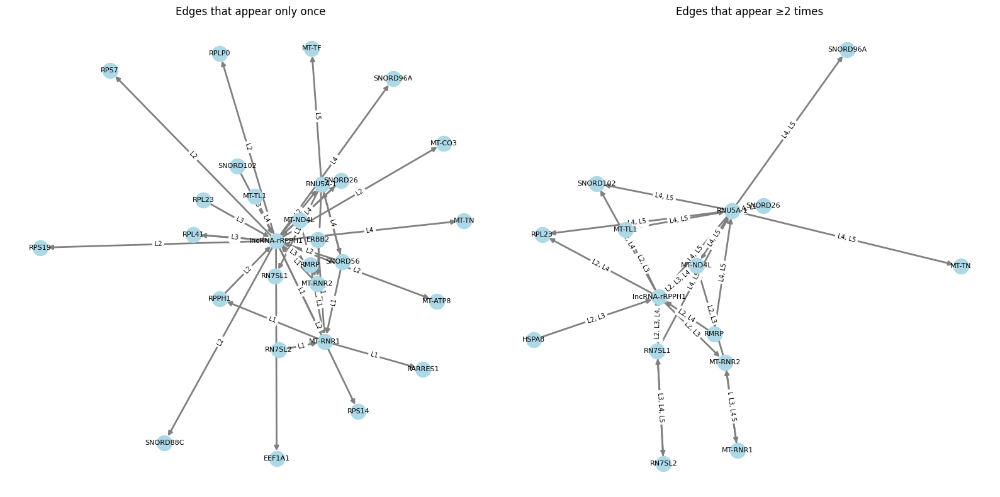

In [15]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from collections import Counter, defaultdict

# read data
df = pd.read_csv("/Users/irmaskaljo/codedev/thesis/Data_preprocessing/Human_coronavirus/HS_consolidated_r5_t0.125.csv")

# 2. count edges and collect modules
edge_counts = Counter()
edge_modules = defaultdict(set)

for _, row in df.iterrows():
    edge = (row["Regulator"], row["TargetGene"])
    edge_counts[edge] += 1
    edge_modules[edge].add(row["Module"])

# 3. create two graphs
G_once = nx.MultiDiGraph()
G_multi = nx.MultiDiGraph()

for edge, count in edge_counts.items():
    u, v = edge
    if count == 1:
        G_once.add_edge(u, v, modules=edge_modules[edge])
    elif count >= 2:
        G_multi.add_edge(u, v, modules=edge_modules[edge])

# 4. Layout -> same for both
G_all = nx.compose(G_once, G_multi)  
pos_all = nx.spring_layout(G_all, k=0.5, seed= 42)

# 5. drawing the graphs
fig, axs = plt.subplots(1, 2, figsize=(16, 8))
graphs = [(G_once, "Edges that appear only once", axs[0]),
          (G_multi, "Edges that appear ≥2 times", axs[1])]

for G, title, ax in graphs:
    plt.sca(ax)
    nx.draw_networkx_nodes(G, pos_all, node_color="lightblue", node_size=300)
    nx.draw_networkx_labels(G, pos_all, font_size=8)
    
    for u, v, data in G.edges(data=True):
        nx.draw_networkx_edges(
            G, pos_all, edgelist=[(u, v)],
            arrows=True, width=2, edge_color="gray"
        )
    
    edge_labels = {
        (u, v): ", ".join(sorted(data["modules"]))
        for u, v, data in G.edges(data=True)
    }
    nx.draw_networkx_edge_labels(G, pos_all, edge_labels=edge_labels, font_size=7)
    ax.set_title(title)
    ax.axis("off")

plt.tight_layout()
plt.show()


threshold = 0.015625

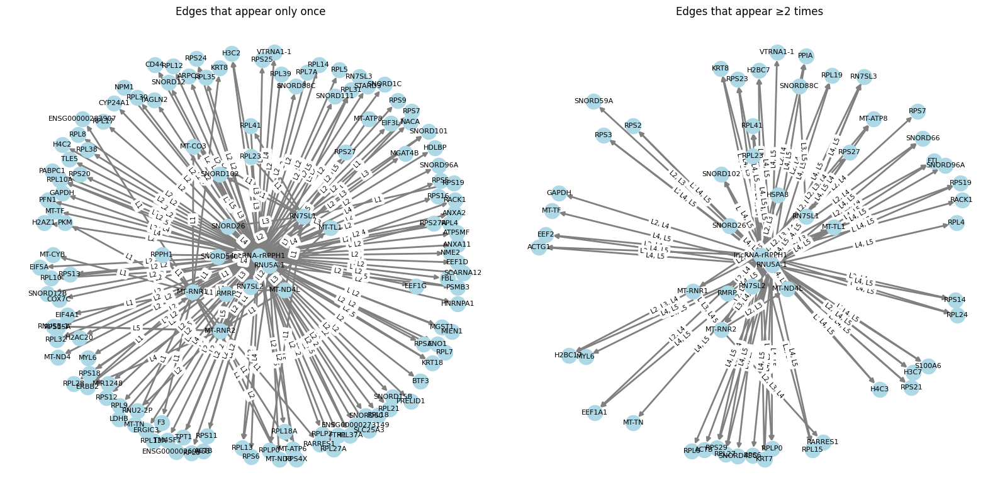

number of edges, once: 180
number of edges, multi: 98


In [16]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from collections import Counter, defaultdict

# read data
df = pd.read_csv("/Users/irmaskaljo/codedev/Gene_Networks/New_Data_10_06_25/GRN/consolidated_r5_t0.015625.csv")

# 2. count edges and collect modules
edge_counts = Counter()
edge_modules = defaultdict(set)

for _, row in df.iterrows():
    edge = (row["Regulator"], row["TargetGene"])
    edge_counts[edge] += 1
    edge_modules[edge].add(row["Source"])

# 3. create two graphs
G_once = nx.MultiDiGraph()
G_multi = nx.MultiDiGraph()

for edge, count in edge_counts.items():
    u, v = edge
    if count == 1:
        G_once.add_edge(u, v, modules=edge_modules[edge])
    elif count >= 2:
        G_multi.add_edge(u, v, modules=edge_modules[edge])

# 4. Layout
G_all = nx.compose(G_once, G_multi)  
pos_all = nx.spring_layout(G_all, k=0.5, seed= 42)

# 5. drawing the graphs
fig, axs = plt.subplots(1, 2, figsize=(16, 8))
graphs = [(G_once, "Edges that appear only once", axs[0]),
          (G_multi, "Edges that appear ≥2 times", axs[1])]

for G, title, ax in graphs:
    plt.sca(ax)
    nx.draw_networkx_nodes(G, pos_all, node_color="lightblue", node_size=300)
    nx.draw_networkx_labels(G, pos_all, font_size=8)
    
    for u, v, data in G.edges(data=True):
        nx.draw_networkx_edges(
            G, pos_all, edgelist=[(u, v)],
            arrows=True, width=2, edge_color="gray"
        )
    
    edge_labels = {
        (u, v): ", ".join(sorted(data["modules"]))
        for u, v, data in G.edges(data=True)
    }
    nx.draw_networkx_edge_labels(G, pos_all, edge_labels=edge_labels, font_size=7)
    ax.set_title(title)
    ax.axis("off")

plt.tight_layout()
plt.show()
print("number of edges, once:", G_once.number_of_edges())
print("number of edges, multi:", G_multi.number_of_edges())


Visualising single-module occurences in dataset with coefficient threshold 0.125; implementing a monochrome color palette -> lighter color for early modules and darker for later ones

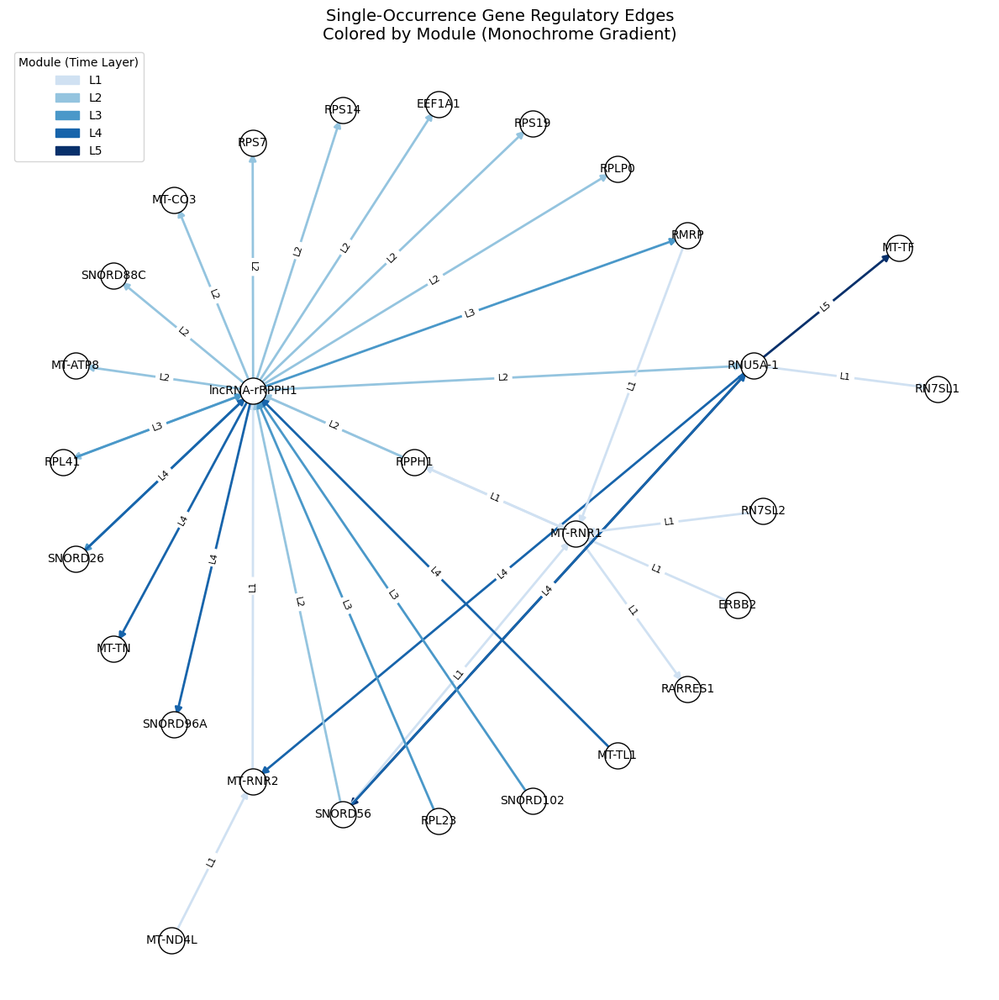

In [18]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict, Counter
from networkx.drawing.nx_agraph import graphviz_layout
import matplotlib.pyplot as plt

# === Load data ===
df = pd.read_csv("/Users/irmaskaljo/codedev/thesis/Data_preprocessing/Human_coronavirus/HS_consolidated_r5_t0.125.csv")

# === Count edges and collect modules ===
edge_counts = Counter()
edge_modules = defaultdict(set)

for _, row in df.iterrows():
    edge = (row["Regulator"], row["TargetGene"])
    edge_counts[edge] += 1
    edge_modules[edge].add(row["Module"])

# === Create graph with single-occurrence edges ===
G_once = nx.DiGraph()
for edge, count in edge_counts.items():
    if count == 1:
        u, v = edge
        G_once.add_edge(u, v, modules=edge_modules[edge])

# === Flatten modules for all edges ===
all_modules = sorted({mod for mods in edge_modules.values() for mod in mods})
module_order = sorted(all_modules)  # Assumes L1, L2, ..., L5
# Avoid very light colors by shifting the scale (e.g., start at 0.2)
min_val, max_val = 0.2, 1.0
steps = len(module_order) - 1
module_to_intensity = {
    mod: min_val + i * (max_val - min_val) / steps
    for i, mod in enumerate(module_order)
}


# === Create a monochrome colormap (e.g., blues) ===
cmap = plt.colormaps["Blues"]

# === Layout ===
pos = graphviz_layout(G_once, prog="twopi")

# === Draw ===
plt.figure(figsize=(12, 12))
ax = plt.gca()

# Draw nodes
nx.draw_networkx_nodes(G_once, pos, node_color="white", edgecolors="black", node_size=500)
nx.draw_networkx_labels(G_once, pos, font_size=10)

# Draw edges with gradient color by module (use average if multiple modules)
for u, v, data in G_once.edges(data=True):
    modules = sorted(data["modules"])
    avg_intensity = sum(module_to_intensity[m] for m in modules) / len(modules)
    edge_color = cmap(avg_intensity)

    nx.draw_networkx_edges(
        G_once, pos,
        edgelist=[(u, v)],
        edge_color=[edge_color],
        arrows=True,
        arrowstyle='-|>',
        arrowsize=12,
        width=2
    )

# Draw edge labels (modules)
edge_labels = {
    (u, v): ", ".join(sorted(data["modules"]))
    for u, v, data in G_once.edges(data=True)
}
nx.draw_networkx_edge_labels(G_once, pos, edge_labels=edge_labels, font_size=8)

# Legend
from matplotlib.patches import Patch
legend_elements = [
    Patch(color=cmap(module_to_intensity[m]), label=m)
    for m in module_order
]
plt.legend(handles=legend_elements, title="Module (Time Layer)", loc="upper left")

plt.title("Single-Occurrence Gene Regulatory Edges\nColored by Module (Monochrome Gradient)", fontsize=14)
plt.axis("off")
plt.tight_layout()
plt.show()


Coefficient threshold 0.015625
- results in many node overlaps -> this was later improved by aggregating terminal nodes

number of edges: 180


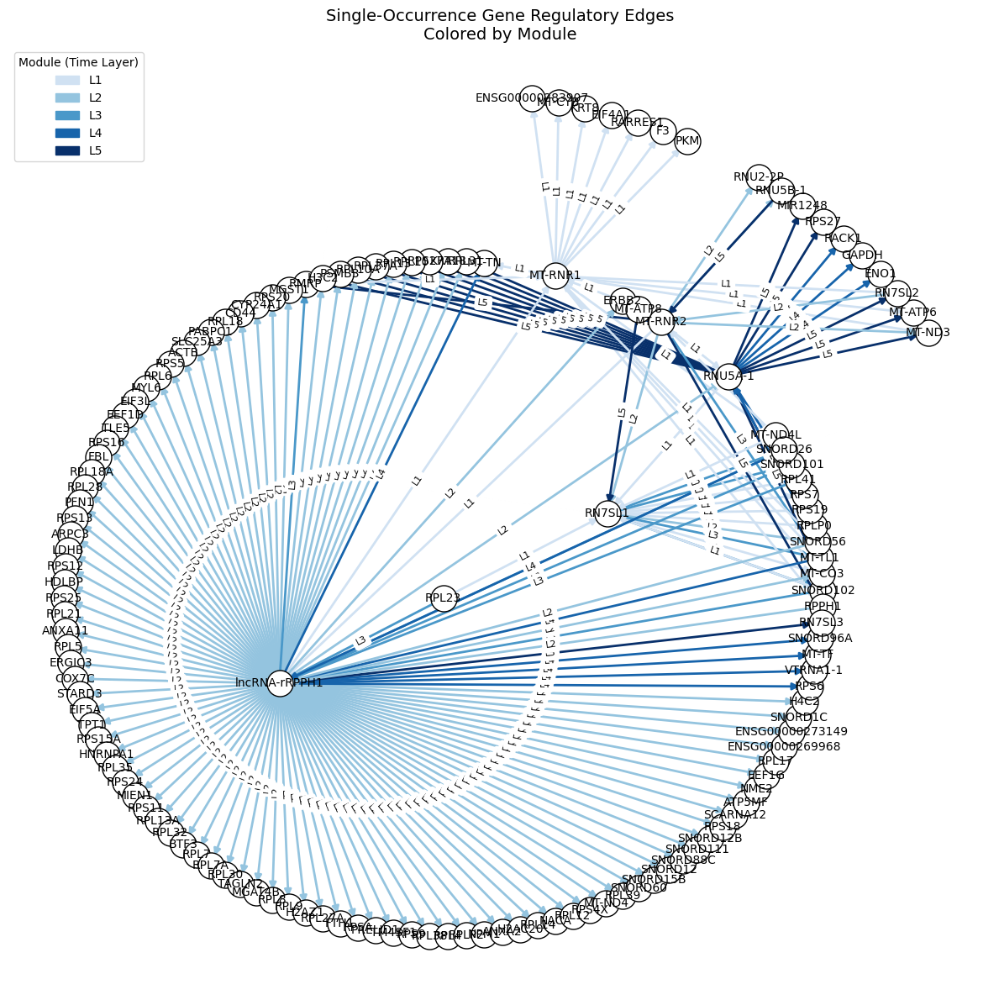

In [19]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict, Counter
from networkx.drawing.nx_agraph import graphviz_layout
import matplotlib.pyplot as plt

# === Load data ===
df = pd.read_csv("/Users/irmaskaljo/codedev/thesis/Data_preprocessing/Human_coronavirus/HS_consolidated_r5_t0.015625.csv")

# === Count edges and collect modules ===
edge_counts = Counter()
edge_modules = defaultdict(set)

for _, row in df.iterrows():
    edge = (row["Regulator"], row["TargetGene"])
    edge_counts[edge] += 1
    edge_modules[edge].add(row["Module"])

# === Create graph with single-occurrence edges ===
G_once = nx.DiGraph()
for edge, count in edge_counts.items():
    if count == 1:
        u, v = edge
        G_once.add_edge(u, v, modules=edge_modules[edge])

# === Flatten modules for all edges ===
all_modules = sorted({mod for mods in edge_modules.values() for mod in mods})
module_order = sorted(all_modules)  # Assumes L1, L2, ..., L5
# Avoid very light colors by shifting the scale (e.g., start at 0.2)
min_val, max_val = 0.2, 1.0
steps = len(module_order) - 1
module_to_intensity = {
    mod: min_val + i * (max_val - min_val) / steps
    for i, mod in enumerate(module_order)
}


# === Create a monochrome colormap (e.g., blues) ===
cmap = plt.colormaps["Blues"]

# === Layout ===
pos = graphviz_layout(G_once, prog="twopi")

# === Draw ===
plt.figure(figsize=(12, 12))
ax = plt.gca()

# Draw nodes
nx.draw_networkx_nodes(G_once, pos, node_color="white", edgecolors="black", node_size=500)
nx.draw_networkx_labels(G_once, pos, font_size=10)

# Draw edges with gradient color by module (use average if multiple modules)
for u, v, data in G_once.edges(data=True):
    modules = sorted(data["modules"])
    avg_intensity = sum(module_to_intensity[m] for m in modules) / len(modules)
    edge_color = cmap(avg_intensity)

    nx.draw_networkx_edges(
        G_once, pos,
        edgelist=[(u, v)],
        edge_color=[edge_color],
        arrows=True,
        arrowstyle='-|>',
        arrowsize=12,
        width=2
    )

# Draw edge labels (modules)
edge_labels = {
    (u, v): ", ".join(sorted(data["modules"]))
    for u, v, data in G_once.edges(data=True)
}
nx.draw_networkx_edge_labels(G_once, pos, edge_labels=edge_labels, font_size=8)

# Legend
from matplotlib.patches import Patch
legend_elements = [
    Patch(color=cmap(module_to_intensity[m]), label=m)
    for m in module_order
]
plt.legend(handles=legend_elements, title="Module (Time Layer)", loc="upper left")

plt.title("Single-Occurrence Gene Regulatory Edges\nColored by Module", fontsize=14)
plt.axis("off")
plt.tight_layout()
print('number of edges:', G_once.number_of_edges())
plt.show()


Node aggregation for terminal genes which are being regulated by the same gene in the same module,  and which don't regulate any further genes
- twopi layout, root node selection based on shortest path to all other nodes

Best root node (excluding aggregated nodes): MT-RNR2
number of edges: 61
Number of total nodes: 32


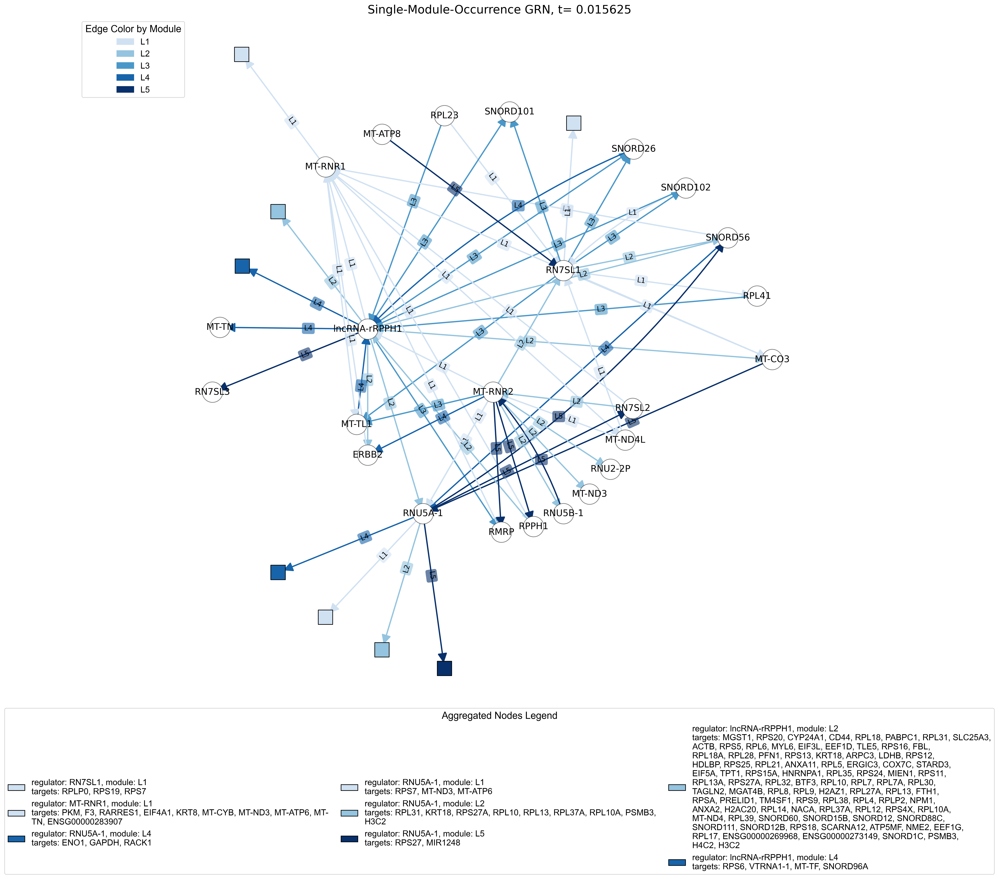

In [20]:
# edge lbels for arced edges
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict, Counter
from networkx.drawing.nx_agraph import graphviz_layout
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
import textwrap
import matplotlib.gridspec as gridspec
import numpy as np
from matplotlib import font_manager

# === Load Data ===
df = pd.read_csv('/Users/irmaskaljo/codedev/thesis/Data_preprocessing/Human_coronavirus/HS_consolidated_r5_t0.015625.csv')

# === Count edges and collect modules ===
edge_counts = Counter()
edge_modules = defaultdict(set)
for _, row in df.iterrows():
    edge = (row["Regulator"], row["TargetGene"])
    edge_counts[edge] += 1
    edge_modules[edge].add(row["Module"])

# === Filter only single-occurrence edges ===
single_edges = {e for e, c in edge_counts.items() if c == 1}
df_once = df[df.apply(lambda row: (row["Regulator"], row["TargetGene"]) in single_edges, axis=1)]

# === Build Graph from single-occurrence edges ===
G_full = nx.DiGraph()
node_modules = defaultdict(list)
edge_modules_single = defaultdict(set)
for _, row in df_once.iterrows():
    u, v, mod = row["Regulator"], row["TargetGene"], row["Module"]
    G_full.add_edge(u, v)
    edge_modules_single[(u, v)].add(mod)
    node_modules[u].append(mod)
    node_modules[v].append(mod)

# === Assign dominant module per node ===
node_cluster = {n: Counter(mods).most_common(1)[0][0] for n, mods in node_modules.items()}
terminal_nodes = [n for n in G_full.nodes() if G_full.out_degree(n) == 0]

# === Group terminal targets for supernodes ===
grouped_targets = defaultdict(list)
for u, v in G_full.edges():
    if v in terminal_nodes:
        grouped_targets[(u, node_cluster[v])].append(v)

# === Build simplified graph ===
G = nx.DiGraph()
new_node_cluster = {}
new_edge_modules = {}
supernodes = {}
supernode_module = {}

for u, v in G_full.edges():
    if v in terminal_nodes:
        continue
    G.add_edge(u, v)
    new_edge_modules[(u, v)] = edge_modules_single[(u, v)]
    new_node_cluster[u] = node_cluster[u]
    new_node_cluster[v] = node_cluster[v]

for (reg, mod), targets in grouped_targets.items():
    if len(targets) == 1:
        v = targets[0]
        G.add_edge(reg, v)
        new_edge_modules[(reg, v)] = edge_modules_single[(reg, v)]
        new_node_cluster[reg] = node_cluster[reg]
        new_node_cluster[v] = node_cluster[v]
    else:
        sn = f"group_{reg}_{mod}"
        G.add_edge(reg, sn)
        new_edge_modules[(reg, sn)] = {mod}
        new_node_cluster[reg] = node_cluster[reg]
        new_node_cluster[sn] = mod
        supernodes[sn] = targets
        supernode_module[sn] = mod

# === Color Mapping ===
all_modules = sorted({m for mods in new_edge_modules.values() for m in mods})
min_val, max_val = 0.2, 1.0
steps = len(all_modules) - 1 if len(all_modules) > 1 else 1
module_to_intensity = {
    mod: min_val + i * (max_val - min_val) / steps for i, mod in enumerate(all_modules)
}
cmap = plt.colormaps["Blues"]

# === Layout ===
try:
    candidate_nodes = [n for n in G.nodes() if n not in supernodes]
    lengths = {}

    for node in candidate_nodes:
        sp = nx.single_source_shortest_path_length(G, node)
        reachable = [t for t in sp if t != node and t not in supernodes]
        if reachable:
            avg_length = sum(sp[t] for t in reachable) / len(reachable)
            lengths[node] = avg_length

    best_root = min(lengths, key=lengths.get)
    print(f"Best root node (excluding aggregated nodes): {best_root}")
except:
    best_root = candidate_nodes[0] if candidate_nodes else list(G.nodes())[0]
    print("No valid root found — using fallback.")

pos = graphviz_layout(G, prog="twopi", root=best_root)

# === Create Figure ===
fig = plt.figure(figsize=(20, 18), dpi = 300)
gs = gridspec.GridSpec(2, 1, height_ratios=[8, 0.7])
ax_graph = plt.subplot(gs[0])
ax_legend = plt.subplot(gs[1])
ax_legend.axis("off")

# === Draw Nodes ===
regular_nodes = [n for n in G.nodes() if n not in supernodes]
supernode_list = list(supernodes)
transparent_black = (0, 0, 0, 0.5)  # RGB + alpha (0.3 = 30% opacity)

nx.draw_networkx_nodes(G, pos, nodelist=regular_nodes,
                       node_color="white", edgecolors=transparent_black,
                       node_shape='o', node_size=1000, ax=ax_graph)

nx.draw_networkx_nodes(G, pos, nodelist=supernode_list,
    node_color=[cmap(module_to_intensity[supernode_module[n]]) for n in supernode_list],
    edgecolors="black", node_shape='s', node_size=500, ax=ax_graph)

nx.draw_networkx_labels(G, pos, labels={n: n for n in regular_nodes},
                        font_size=14, ax=ax_graph)

# === Identify bidirectional edges ===
mutual_edges = set()
for u, v in G.edges():
    if G.has_edge(v, u) and (v, u) not in mutual_edges:
        mutual_edges.add((u, v))

# === Precompute edge colors ===
edge_to_color = {}
for u, v in G.edges():
    modules = sorted(new_edge_modules.get((u, v), []))
    if modules:
        avg_intensity = sum(module_to_intensity[m] for m in modules) / len(modules)
        edge_to_color[(u, v)] = cmap(avg_intensity)

# === Draw Edges ===
drawn_mutual = set()
for u, v, data in G.edges(data=True):
    edge_color = edge_to_color[(u, v)]
    if (v, u) in mutual_edges and (v, u) not in drawn_mutual:
        connection = 'arc3,rad=0.1'
        drawn_mutual.add((u, v))
    else:
        connection = 'arc3,rad=0.0'

    nx.draw_networkx_edges(
        G, pos, edgelist=[(u, v)],
        edge_color=[edge_color], arrows=True,
        arrowstyle='-|>', arrowsize=30, width=2,
        connectionstyle=connection, ax=ax_graph
    )

# === Draw Edge Labels (Curved Support) ===
def curved_label_pos(pos_src, pos_dst, curvature=0.03, label_pos=0.4):
    dx = pos_dst[0] - pos_src[0]
    dy = pos_dst[1] - pos_src[1]
    mx = pos_src[0] + dx * label_pos
    my = pos_src[1] + dy * label_pos
    # Flip the perpendicular vector for opposite side
    perp_dx = dy
    perp_dy = -dx
    norm = np.hypot(perp_dx, perp_dy)
    if norm == 0:
        return (mx, my)
    offset = curvature * np.sqrt(dx**2 + dy**2)
    label_x = mx + perp_dx / norm * offset
    label_y = my + perp_dy / norm * offset
    return (label_x, label_y)


edge_labels = {(u, v): ", ".join(sorted(mods)) for (u, v), mods in new_edge_modules.items()}
for (u, v), label in edge_labels.items():
    edge_color = edge_to_color.get((u, v), "white")
    is_curved = ((v, u) in mutual_edges)
    if is_curved:
        x, y = curved_label_pos(pos[u], pos[v], curvature=0.05, label_pos=0.4)
        ax_graph.text(x, y, label, fontsize=11,
                      bbox=dict(boxstyle='round', facecolor=edge_color, edgecolor='none', alpha=0.6),
                      horizontalalignment='center')
    else:
        nx.draw_networkx_edge_labels(
            G, pos,
            edge_labels={(u, v): label},
            font_size=11, label_pos=0.4,
            bbox=dict(boxstyle='round', facecolor=edge_color, edgecolor='none', alpha=0.6),
            ax=ax_graph
        )

# === Final Touches ===
ax_graph.set_title("Single-Module-Occurrence GRN, t= 0.015625", fontsize=18)
ax_graph.axis("off")

# === Legends ===
custom_font = font_manager.FontProperties(family='Arial', size=13)
title_font = {'family': 'Arial', 'size': 15}

legend_lines = [
    Patch(color=cmap(module_to_intensity[m]), label=m) for m in all_modules
]

legend_supernodes = []
supernode_labels = []
for sn in supernode_list:
    mod = supernode_module[sn]
    targets = supernodes[sn]
    # Extract regulator name from supernode label (group_<reg>_<mod>)
    parts = sn.split("_")
    regulator_gene = parts[1] if len(parts) > 1 else "Unknown"

    wrapped = "\n".join(textwrap.wrap(", ".join(targets), width=60))
    label = f"regulator: {regulator_gene}, module: {mod}\n" \
            f"targets: {wrapped}"
    
    color = cmap(module_to_intensity[mod])
    legend_supernodes.append(Patch(facecolor=color, edgecolor='black'))
    supernode_labels.append(label)

legend = ax_graph.legend(
    handles=legend_lines,
    title="Edge Color by Module",
    loc='upper left',
    bbox_to_anchor=(-0.15, 1.0),
    prop=custom_font  # Applies to legend labels
)

# Apply font to legend title
legend.set_title("Edge Color by Module", prop=title_font) 

legend_super = ax_legend.legend(
    handles=legend_supernodes, labels=supernode_labels,
    loc='upper center', bbox_to_anchor=(0.5, 1.12),
    prop=custom_font, title="Aggregated Nodes Legend", ncol=3,
    frameon=True, columnspacing=1.5
)
legend_super.set_title("Aggregated Nodes Legend", prop=title_font)

plt.tight_layout()
plt.subplots_adjust(hspace=0.01, bottom=0.05, top=0.95)
print('number of edges:', G.number_of_edges())
print('Number of total nodes:', len(G.nodes()))
plt.show()



Degree Distribution Stats:
Number of nodes: 32
Min degree: 1
Max degree: 19
Average degree: 3.81
Median degree: 2.00
Percentage of nodes with degree > 15: 3.12%


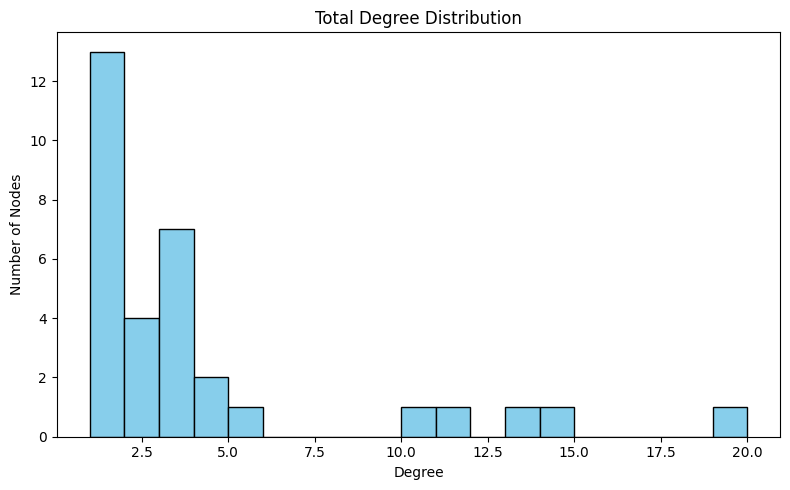

In [21]:
import statistics

# === Quantify Degree Distribution ===
in_degrees = dict(G.in_degree())
out_degrees = dict(G.out_degree())
total_degrees = {node: in_degrees[node] + out_degrees[node] for node in G.nodes()}
high_degree_nodes = [node for node, deg in total_degrees.items() if deg > 15]
percentage_high_degree = (len(high_degree_nodes) / len(G.nodes())) * 100

# Print summary statistics
print("\nDegree Distribution Stats:")
print(f"Number of nodes: {len(G.nodes())}")
print(f"Min degree: {min(total_degrees.values())}")
print(f"Max degree: {max(total_degrees.values())}")
print(f"Average degree: {sum(total_degrees.values()) / len(total_degrees):.2f}")
print(f"Median degree: {statistics.median(total_degrees.values()):.2f}")
print(f"Percentage of nodes with degree > 15: {percentage_high_degree:.2f}%")

# Optional: plot histogram of total degree distribution
plt.figure(figsize=(8, 5))
plt.hist(total_degrees.values(), bins=range(1, max(total_degrees.values()) + 2), 
         color='skyblue', edgecolor='black')
plt.title("Total Degree Distribution")
plt.xlabel("Degree")
plt.ylabel("Number of Nodes")
plt.tight_layout()
plt.show()


Visualising Multi- Module occurences from the same dataset
- edge color: Blues palette -> the more modules an interaction in present in, the darker the blue
- root node selected as a node witht the shortest path to other nodes

root node: RNU5A-1
Number of edges: 98
Number of nodes: 58


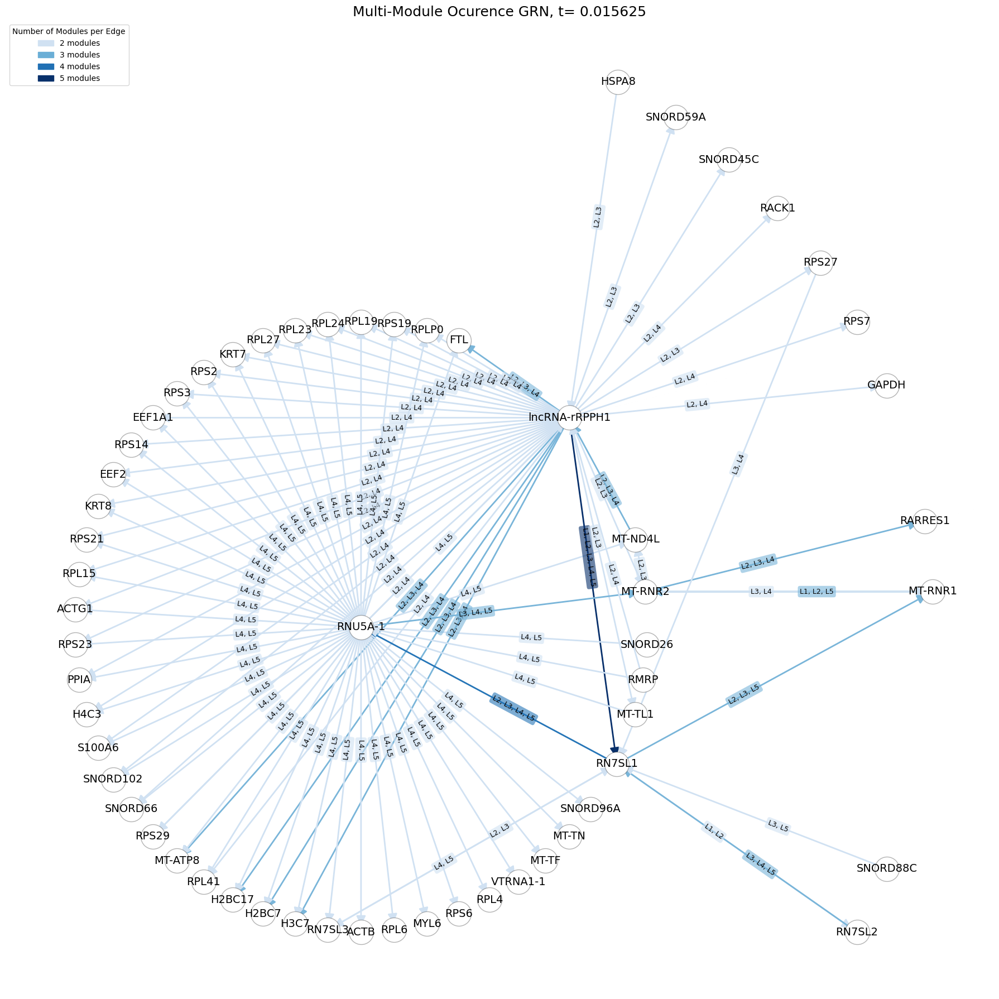

In [22]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict, Counter
from networkx.drawing.nx_agraph import graphviz_layout
from matplotlib.patches import Patch

# === Load data ===
df = pd.read_csv("/Users/irmaskaljo/codedev/thesis/Data_preprocessing/Human_coronavirus/HS_consolidated_r5_t0.015625.csv")
transparent_black=(0, 0, 0, 0.3)

# === Count edges and collect module sets ===
edge_counts = Counter()
edge_modules = defaultdict(set)
for _, row in df.iterrows():
    edge = (row["Regulator"], row["TargetGene"])
    edge_counts[edge] += 1
    edge_modules[edge].add(row["Module"])

# === Select only multi-module edges (≥2 modules) ===
multi_edges = {e for e, mods in edge_modules.items() if len(mods) >= 2}
df_multi = df[df.apply(lambda row: (row["Regulator"], row["TargetGene"]) in multi_edges, axis=1)]

# === Build graph ===
G = nx.DiGraph()
edge_module_sets = defaultdict(set)
for _, row in df_multi.iterrows():
    u, v, mod = row["Regulator"], row["TargetGene"], row["Module"]
    G.add_edge(u, v)
    edge_module_sets[(u, v)].add(mod)

# === Define edge color based on number of modules ===
def get_edge_color(modset, cmap, min_val=0.2, max_val=1.0):
    count = min(len(modset), 5)  # cap at 5 modules
    factor = (count - 2) / 3  # 2 mods → 0.0, 5 mods → 1.0
    return cmap(min_val + factor * (max_val - min_val))

cmap = plt.colormaps["Blues"]
edge_colors = { (u, v): get_edge_color(mods, cmap) for (u, v), mods in edge_module_sets.items() }

# === Layout ===
# Pick a root with lowest avg shortest path (excluding disconnected)
lengths = {}
nodes = list(G.nodes())
for node in nodes:
    sp = nx.single_source_shortest_path_length(G, node)
    if len(sp) > 1:
        avg = sum(sp.values()) / len(sp)
        lengths[node] = avg

root = min(lengths, key=lengths.get) if lengths else list(G.nodes())[0]
print("root node:", root)
pos = graphviz_layout(G, prog="twopi", root=root)

# === Plot ===
fig, ax = plt.subplots(figsize=(18, 18))

# Draw nodes
nx.draw_networkx_nodes(G, pos,
    node_color="white", edgecolors=transparent_black,
    node_size=1000, ax=ax)

nx.draw_networkx_labels(G, pos,
    font_size=14, ax=ax)

# Draw curved edges if bidirectional
mutual_edges = set()
for u, v in G.edges():
    if G.has_edge(v, u) and (v, u) not in mutual_edges:
        mutual_edges.add((u, v))

drawn_mutual = set()
for u, v in G.edges():
    color = edge_colors[(u, v)]
    connection = 'arc3,rad=0.1' if (v, u) in mutual_edges and (v, u) not in drawn_mutual else 'arc3,rad=0.0'
    drawn_mutual.add((u, v))
    nx.draw_networkx_edges(
        G, pos,
        edgelist=[(u, v)],
        edge_color=[color],
        arrows=True,
        arrowstyle='-|>', arrowsize=25, width=2,
        connectionstyle=connection, ax=ax
    )

# Edge labels
edge_labels = { (u, v): ", ".join(sorted(mods)) for (u, v), mods in edge_module_sets.items() }
for (u, v), label in edge_labels.items():
    color = edge_colors[(u, v)]
    nx.draw_networkx_edge_labels(
        G, pos, edge_labels={(u, v): label},
        font_size=9, label_pos=0.4,
        bbox=dict(boxstyle='round', facecolor=color, edgecolor='none', alpha=0.6),
        ax=ax
    )

# Legend
legend = [
    Patch(color=cmap(0.2), label="2 modules"),
    Patch(color=cmap(0.5), label="3 modules"),
    Patch(color=cmap(0.75), label="4 modules"),
    Patch(color=cmap(1.0), label="5 modules")
]
ax.legend(handles=legend, title="Number of Modules per Edge", loc="upper left", fontsize=10)

plt.title("Multi-Module Ocurence GRN, t= 0.015625", fontsize=18)
plt.axis("off")
plt.tight_layout()
print("Number of edges:", G.number_of_edges())
print("Number of nodes:", G.number_of_nodes())
plt.show()



Degree Distribution Stats:
Number of nodes: 58
Min degree: 1
Max degree: 46
Average degree: 3.3793103448275863


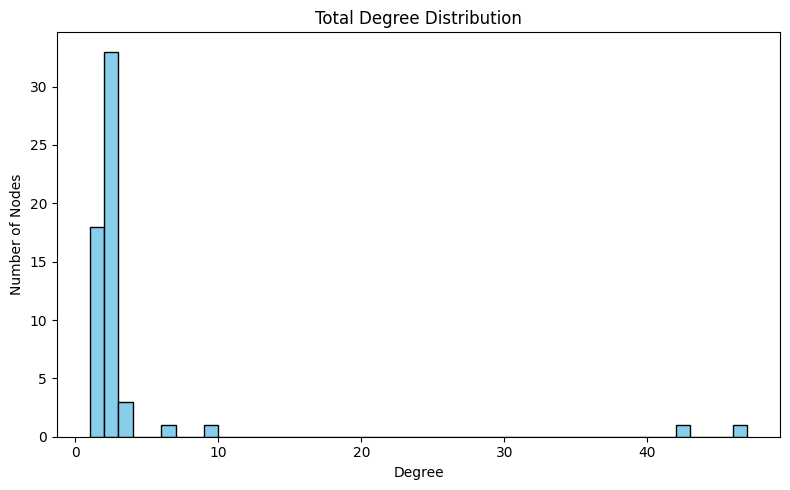

In [23]:
# === Quantify Degree Distribution ===
in_degrees = dict(G.in_degree())
out_degrees = dict(G.out_degree())
total_degrees = {node: in_degrees[node] + out_degrees[node] for node in G.nodes()}

# Print basic stats
print("\nDegree Distribution Stats:")
print(f"Number of nodes: {len(G.nodes())}")
print(f"Min degree: {min(total_degrees.values())}")
print(f"Max degree: {max(total_degrees.values())}")
print(f"Average degree: {sum(total_degrees.values()) / len(total_degrees)}")

# Optional: plot histogram of degree distribution
plt.figure(figsize=(8, 5))
plt.hist(total_degrees.values(), bins=range(1, max(total_degrees.values()) + 2), color='skyblue', edgecolor='black')
plt.title("Total Degree Distribution")
plt.xlabel("Degree")
plt.ylabel("Number of Nodes")
plt.tight_layout()
plt.show()


Coefficient threshold = 0.125, single module occurence

Best root node (excluding supernodes): lncRNA-rRPPH1
number of edges: 27
number of terminal nodes: 13


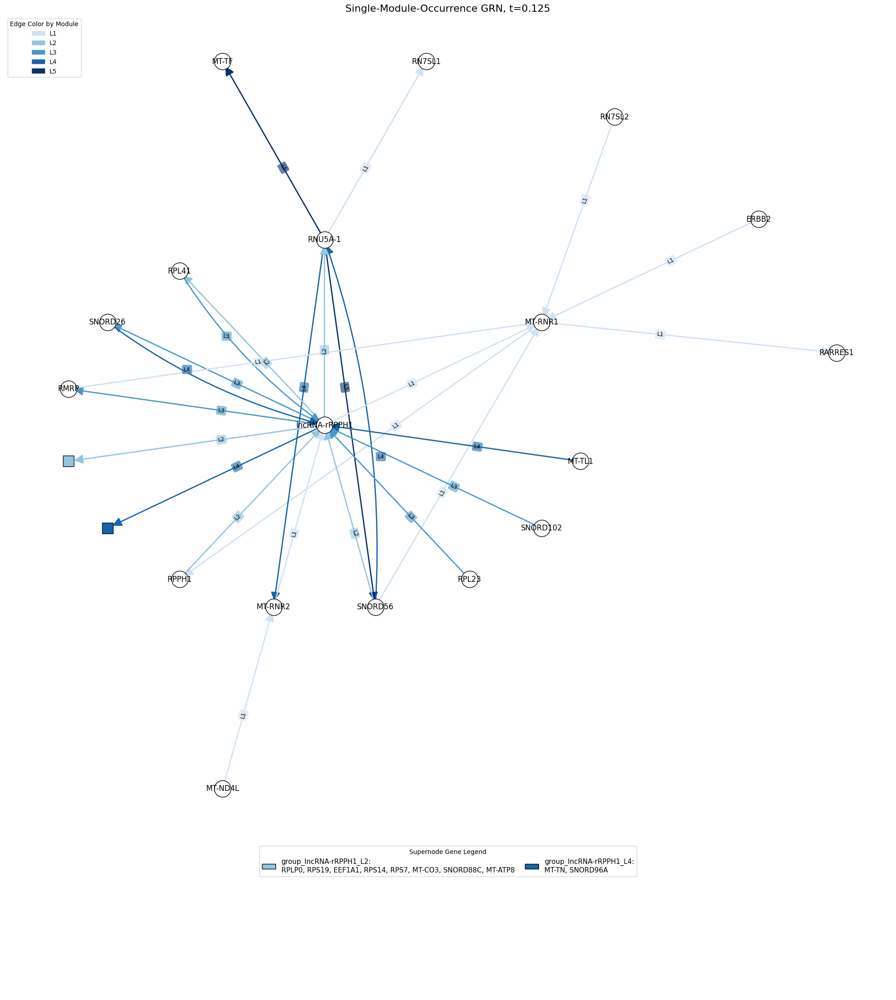

In [37]:
# edge lbels for arced edges
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict, Counter
from networkx.drawing.nx_agraph import graphviz_layout
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
import textwrap
import matplotlib.gridspec as gridspec
import numpy as np

# === Load Data ===
df = pd.read_csv('/Users/irmaskaljo/codedev/thesis/Data_preprocessing/Human_coronavirus/HS_consolidated_r5_t0.125.csv')

# === Count edges and collect modules ===
edge_counts = Counter()
edge_modules = defaultdict(set)
for _, row in df.iterrows():
    edge = (row["Regulator"], row["TargetGene"])
    edge_counts[edge] += 1
    edge_modules[edge].add(row["Module"])

# === Filter only single-occurrence edges ===
single_edges = {e for e, c in edge_counts.items() if c == 1}
df_once = df[df.apply(lambda row: (row["Regulator"], row["TargetGene"]) in single_edges, axis=1)]

# === Build Graph from single-occurrence edges ===
G_full = nx.DiGraph()
node_modules = defaultdict(list)
edge_modules_single = defaultdict(set)
for _, row in df_once.iterrows():
    u, v, mod = row["Regulator"], row["TargetGene"], row["Module"]
    G_full.add_edge(u, v)
    edge_modules_single[(u, v)].add(mod)
    node_modules[u].append(mod)
    node_modules[v].append(mod)

# === Assign dominant module per node ===
node_cluster = {n: Counter(mods).most_common(1)[0][0] for n, mods in node_modules.items()}
terminal_nodes = [n for n in G_full.nodes() if G_full.out_degree(n) == 0]

# === Group terminal targets for supernodes ===
grouped_targets = defaultdict(list)
for u, v in G_full.edges():
    if v in terminal_nodes:
        grouped_targets[(u, node_cluster[v])].append(v)

# === Build simplified graph ===
G = nx.DiGraph()
new_node_cluster = {}
new_edge_modules = {}
supernodes = {}
supernode_module = {}

for u, v in G_full.edges():
    if v in terminal_nodes:
        continue
    G.add_edge(u, v)
    new_edge_modules[(u, v)] = edge_modules_single[(u, v)]
    new_node_cluster[u] = node_cluster[u]
    new_node_cluster[v] = node_cluster[v]

for (reg, mod), targets in grouped_targets.items():
    if len(targets) == 1:
        v = targets[0]
        G.add_edge(reg, v)
        new_edge_modules[(reg, v)] = edge_modules_single[(reg, v)]
        new_node_cluster[reg] = node_cluster[reg]
        new_node_cluster[v] = node_cluster[v]
    else:
        sn = f"group_{reg}_{mod}"
        G.add_edge(reg, sn)
        new_edge_modules[(reg, sn)] = {mod}
        new_node_cluster[reg] = node_cluster[reg]
        new_node_cluster[sn] = mod
        supernodes[sn] = targets
        supernode_module[sn] = mod

# === Color Mapping ===
all_modules = sorted({m for mods in new_edge_modules.values() for m in mods})
min_val, max_val = 0.2, 1.0
steps = len(all_modules) - 1 if len(all_modules) > 1 else 1
module_to_intensity = {
    mod: min_val + i * (max_val - min_val) / steps for i, mod in enumerate(all_modules)
}
cmap = plt.colormaps["Blues"]

# === Layout ===
try:
    candidate_nodes = [n for n in G.nodes() if n not in supernodes]
    lengths = {}

    for node in candidate_nodes:
        sp = nx.single_source_shortest_path_length(G, node)
        reachable = [t for t in sp if t != node and t not in supernodes]
        if reachable:
            avg_length = sum(sp[t] for t in reachable) / len(reachable)
            lengths[node] = avg_length

    best_root = min(lengths, key=lengths.get)
    print(f"Best root node (excluding supernodes): {best_root}")
except:
    best_root = candidate_nodes[0] if candidate_nodes else list(G.nodes())[0]
    print("No valid root found — using fallback.")

pos = graphviz_layout(G, prog="twopi", root=best_root)

# === Create Figure ===
fig = plt.figure(figsize=(20, 29))
gs = gridspec.GridSpec(2, 1, height_ratios=[6, 1])
ax_graph = plt.subplot(gs[0])
ax_legend = plt.subplot(gs[1])
ax_legend.axis("off")

# === Draw Nodes ===
regular_nodes = [n for n in G.nodes() if n not in supernodes]
supernode_list = list(supernodes)

nx.draw_networkx_nodes(G, pos, nodelist=regular_nodes,
                       node_color="white", edgecolors="black",
                       node_shape='o', node_size=700, ax=ax_graph)

nx.draw_networkx_nodes(G, pos, nodelist=supernode_list,
    node_color=[cmap(module_to_intensity[supernode_module[n]]) for n in supernode_list],
    edgecolors="black", node_shape='s', node_size=300, ax=ax_graph)

nx.draw_networkx_labels(G, pos, labels={n: n for n in regular_nodes},
                        font_size=12, ax=ax_graph)

# === Identify bidirectional edges ===
mutual_edges = set()
for u, v in G.edges():
    if G.has_edge(v, u) and (v, u) not in mutual_edges:
        mutual_edges.add((u, v))

# === Precompute edge colors ===
edge_to_color = {}
for u, v in G.edges():
    modules = sorted(new_edge_modules.get((u, v), []))
    if modules:
        avg_intensity = sum(module_to_intensity[m] for m in modules) / len(modules)
        edge_to_color[(u, v)] = cmap(avg_intensity)

# === Draw Edges ===
drawn_mutual = set()
for u, v, data in G.edges(data=True):
    edge_color = edge_to_color[(u, v)]
    if (v, u) in mutual_edges and (v, u) not in drawn_mutual:
        connection = 'arc3,rad=0.1'
        drawn_mutual.add((u, v))
    else:
        connection = 'arc3,rad=0.0'

    nx.draw_networkx_edges(
        G, pos, edgelist=[(u, v)],
        edge_color=[edge_color], arrows=True,
        arrowstyle='-|>', arrowsize=30, width=2,
        connectionstyle=connection, ax=ax_graph
    )

# === Draw Edge Labels (Curved Support) ===
def curved_label_pos(pos_src, pos_dst, curvature=0.03, label_pos=0.4):
    dx = pos_dst[0] - pos_src[0]
    dy = pos_dst[1] - pos_src[1]
    mx = pos_src[0] + dx * label_pos
    my = pos_src[1] + dy * label_pos
    # Flip the perpendicular vector for opposite side
    perp_dx = dy
    perp_dy = -dx
    norm = np.hypot(perp_dx, perp_dy)
    if norm == 0:
        return (mx, my)
    offset = curvature * np.sqrt(dx**2 + dy**2)
    label_x = mx + perp_dx / norm * offset
    label_y = my + perp_dy / norm * offset
    return (label_x, label_y)


edge_labels = {(u, v): ", ".join(sorted(mods)) for (u, v), mods in new_edge_modules.items()}
for (u, v), label in edge_labels.items():
    edge_color = edge_to_color.get((u, v), "white")
    is_curved = ((v, u) in mutual_edges)
    if is_curved:
        x, y = curved_label_pos(pos[u], pos[v], curvature=0.05, label_pos=0.4)
        ax_graph.text(x, y, label, fontsize=9,
                      bbox=dict(boxstyle='round', facecolor=edge_color, edgecolor='none', alpha=0.6),
                      horizontalalignment='center')
    else:
        nx.draw_networkx_edge_labels(
            G, pos,
            edge_labels={(u, v): label},
            font_size=9, label_pos=0.4,
            bbox=dict(boxstyle='round', facecolor=edge_color, edgecolor='none', alpha=0.6),
            ax=ax_graph
        )

# === Final Touches ===
ax_graph.set_title("Single-Module-Occurrence GRN, t=0.125", fontsize=16)
ax_graph.axis("off")

# === Legends ===
legend_lines = [
    Patch(color=cmap(module_to_intensity[m]), label=m) for m in all_modules
]

legend_supernodes = []
supernode_labels = []
for sn in supernode_list:
    mod = supernode_module[sn]
    targets = supernodes[sn]
    wrapped = "\n".join(textwrap.wrap(", ".join(targets), width=60))
    color = cmap(module_to_intensity[mod])
    legend_supernodes.append(Patch(facecolor=color, edgecolor='black'))
    supernode_labels.append(f"{sn}:\n{wrapped}")

ax_graph.legend(handles=legend_lines, title="Edge Color by Module", loc='upper left')

legend_super = ax_legend.legend(
    handles=legend_supernodes, labels=supernode_labels,
    loc='upper center', bbox_to_anchor=(0.5, 1.12),
    fontsize=11, title="Supernode Gene Legend", ncol=3,
    frameon=True, columnspacing=1.5
)

plt.tight_layout()
plt.subplots_adjust(hspace=0.05, bottom=0.2, top=0.95)
print('number of edges:', G.number_of_edges())
print('number of terminal nodes:', len(terminal_nodes))
plt.show()


Coefficient threshold = 0.125, multi module occurence

root node: RNU5A-1
number of edges: 23


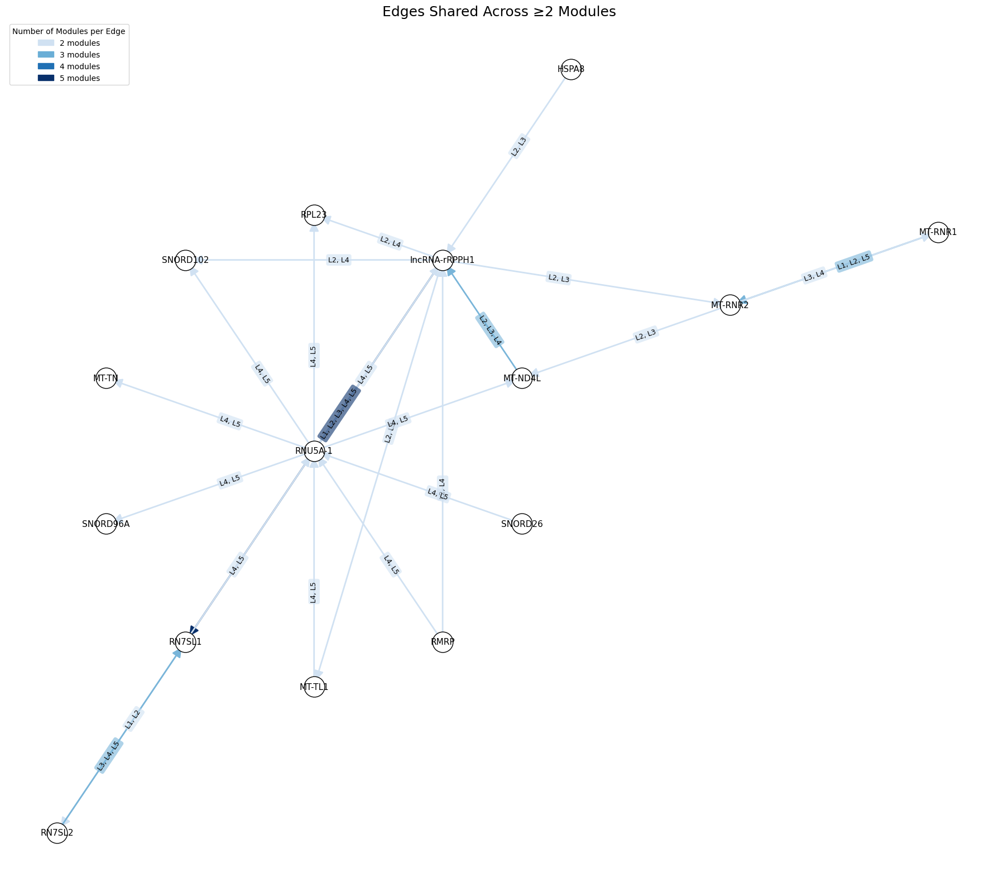

In [38]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict, Counter
from networkx.drawing.nx_agraph import graphviz_layout
from matplotlib.patches import Patch

# === Load data ===
df = pd.read_csv("/Users/irmaskaljo/codedev/thesis/Data_preprocessing/Human_coronavirus/HS_consolidated_r5_t0.125.csv")

# === Count edges and collect module sets ===
edge_counts = Counter()
edge_modules = defaultdict(set)
for _, row in df.iterrows():
    edge = (row["Regulator"], row["TargetGene"])
    edge_counts[edge] += 1
    edge_modules[edge].add(row["Module"])

# === Select only multi-module edges (≥2 modules) ===
multi_edges = {e for e, mods in edge_modules.items() if len(mods) >= 2}
df_multi = df[df.apply(lambda row: (row["Regulator"], row["TargetGene"]) in multi_edges, axis=1)]

# === Build graph ===
G = nx.DiGraph()
edge_module_sets = defaultdict(set)
for _, row in df_multi.iterrows():
    u, v, mod = row["Regulator"], row["TargetGene"], row["Module"]
    G.add_edge(u, v)
    edge_module_sets[(u, v)].add(mod)

# === Define edge color based on number of modules ===
def get_edge_color(modset, cmap, min_val=0.2, max_val=1.0):
    count = min(len(modset), 5)  # cap at 5 modules
    factor = (count - 2) / 3  # 2 mods → 0.0, 5 mods → 1.0
    return cmap(min_val + factor * (max_val - min_val))

cmap = plt.colormaps["Blues"]
edge_colors = { (u, v): get_edge_color(mods, cmap) for (u, v), mods in edge_module_sets.items() }

# === Layout ===
# Pick a root with lowest avg shortest path (excluding disconnected)
lengths = {}
nodes = list(G.nodes())
for node in nodes:
    sp = nx.single_source_shortest_path_length(G, node)
    if len(sp) > 1:
        avg = sum(sp.values()) / len(sp)
        lengths[node] = avg

root = min(lengths, key=lengths.get) if lengths else list(G.nodes())[0]
print("root node:", root)
pos = graphviz_layout(G, prog="twopi", root=root)

# === Plot ===
fig, ax = plt.subplots(figsize=(18, 16))

# Draw nodes
nx.draw_networkx_nodes(G, pos,
    node_color="white", edgecolors="black",
    node_size=700, ax=ax)

nx.draw_networkx_labels(G, pos,
    font_size=11, ax=ax)

# Draw curved edges if bidirectional
mutual_edges = set()
for u, v in G.edges():
    if G.has_edge(v, u) and (v, u) not in mutual_edges:
        mutual_edges.add((u, v))

drawn_mutual = set()
for u, v in G.edges():
    color = edge_colors[(u, v)]
    connection = 'arc3,rad=0.1' if (v, u) in mutual_edges and (v, u) not in drawn_mutual else 'arc3,rad=0.0'
    drawn_mutual.add((u, v))
    nx.draw_networkx_edges(
        G, pos,
        edgelist=[(u, v)],
        edge_color=[color],
        arrows=True,
        arrowstyle='-|>', arrowsize=25, width=2,
        connectionstyle=connection, ax=ax
    )

# Edge labels
edge_labels = { (u, v): ", ".join(sorted(mods)) for (u, v), mods in edge_module_sets.items() }
for (u, v), label in edge_labels.items():
    color = edge_colors[(u, v)]
    nx.draw_networkx_edge_labels(
        G, pos, edge_labels={(u, v): label},
        font_size=9, label_pos=0.4,
        bbox=dict(boxstyle='round', facecolor=color, edgecolor='none', alpha=0.6),
        ax=ax
    )

# Legend
legend = [
    Patch(color=cmap(0.2), label="2 modules"),
    Patch(color=cmap(0.5), label="3 modules"),
    Patch(color=cmap(0.75), label="4 modules"),
    Patch(color=cmap(1.0), label="5 modules")
]
ax.legend(handles=legend, title="Number of Modules per Edge", loc="upper left", fontsize=10)

plt.title("Edges Shared Across ≥2 Modules", fontsize=18)
plt.axis("off")
plt.tight_layout()
print('number of edges:', G.number_of_edges())
plt.show()


# Visualising single module occurences for all human datasets without node aggregation

Best root node: RN7SL1


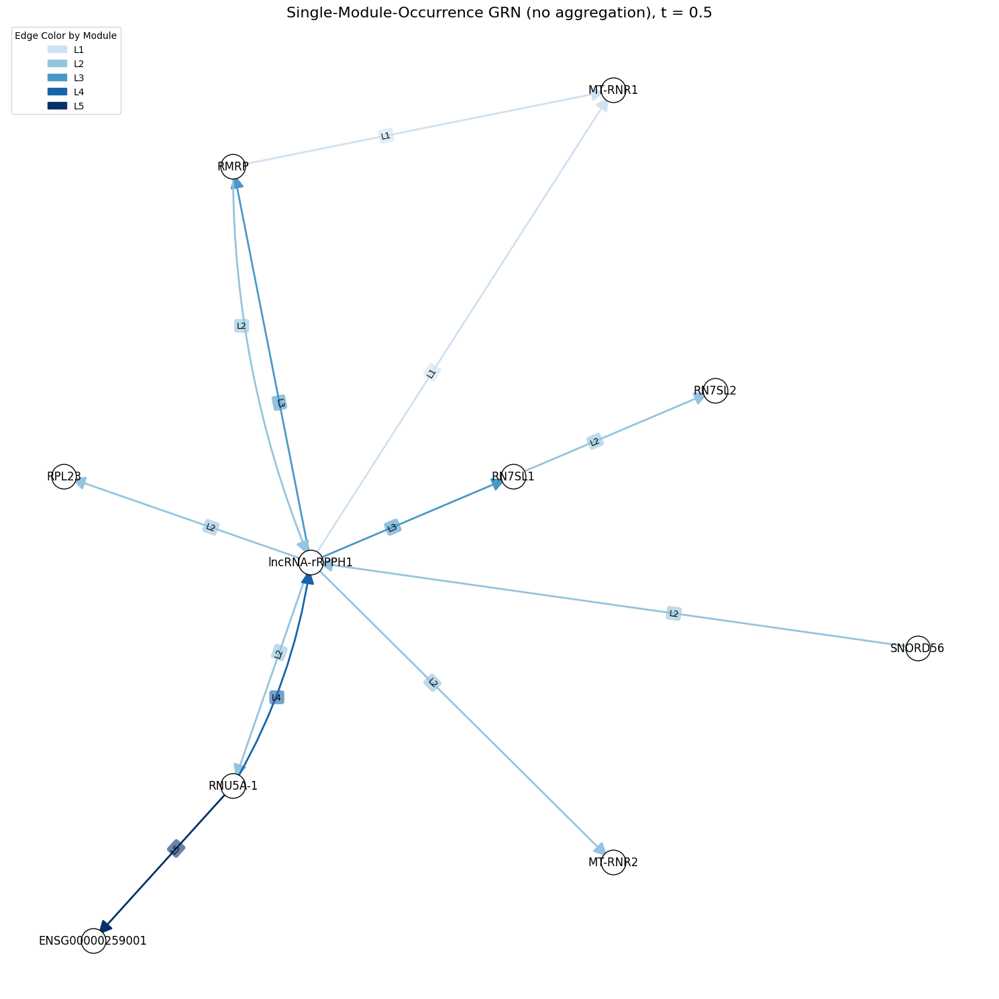

In [39]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict, Counter
from networkx.drawing.nx_agraph import graphviz_layout
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
import numpy as np

# === Load Data ===
df = pd.read_csv('/Users/irmaskaljo/codedev/thesis/Data_preprocessing/Human_coronavirus/HS_consolidated_r5_t0.5.csv')

# === Count edges and modules ===
edge_counts = Counter()
edge_modules = defaultdict(set)
for _, row in df.iterrows():
    edge = (row["Regulator"], row["TargetGene"])
    edge_counts[edge] += 1
    edge_modules[edge].add(row["Module"])

# === Filter to single-occurrence edges ===
single_edges = {e for e, c in edge_counts.items() if c == 1}
df_once = df[df.apply(lambda row: (row["Regulator"], row["TargetGene"]) in single_edges, axis=1)]

# === Build Graph ===
G = nx.DiGraph()
node_modules = defaultdict(list)
edge_modules_single = defaultdict(set)

for _, row in df_once.iterrows():
    u, v, mod = row["Regulator"], row["TargetGene"], row["Module"]
    G.add_edge(u, v)
    edge_modules_single[(u, v)].add(mod)
    node_modules[u].append(mod)
    node_modules[v].append(mod)

# === Dominant module per node ===
node_cluster = {n: Counter(mods).most_common(1)[0][0] for n, mods in node_modules.items()}

# === Color Mapping ===
all_modules = sorted({m for mods in edge_modules_single.values() for m in mods})
min_val, max_val = 0.2, 1.0
steps = len(all_modules) - 1 if len(all_modules) > 1 else 1
module_to_intensity = {
    mod: min_val + i * (max_val - min_val) / steps for i, mod in enumerate(all_modules)
}
cmap = plt.colormaps["Blues"]

# === Layout ===
try:
    candidate_nodes = [n for n in G.nodes()]
    lengths = {}

    for node in candidate_nodes:
        sp = nx.single_source_shortest_path_length(G, node)
        reachable = [t for t in sp if t != node]
        if reachable:
            avg_length = sum(sp[t] for t in reachable) / len(reachable)
            lengths[node] = avg_length

    best_root = min(lengths, key=lengths.get)
    print(f"Best root node: {best_root}")
except:
    best_root = list(G.nodes())[0]
    print("No valid root found — using fallback.")

pos = graphviz_layout(G, prog="twopi", root=best_root)

# === Create Figure ===
plt.figure(figsize=(15,15))
ax = plt.gca()

# === Draw Nodes ===
nx.draw_networkx_nodes(G, pos,
                       node_color="white",
                       edgecolors="black",
                       node_shape='o', node_size=700, ax=ax)

nx.draw_networkx_labels(G, pos,
                        labels={n: n for n in G.nodes()},
                        font_size=12, ax=ax)

# === Edge colors ===
mutual_edges = set()
for u, v in G.edges():
    if G.has_edge(v, u) and (v, u) not in mutual_edges:
        mutual_edges.add((u, v))

edge_to_color = {}
for u, v in G.edges():
    modules = sorted(edge_modules_single.get((u, v), []))
    if modules:
        avg_intensity = sum(module_to_intensity[m] for m in modules) / len(modules)
        edge_to_color[(u, v)] = cmap(avg_intensity)

# === Draw Edges ===
drawn_mutual = set()
for u, v in G.edges():
    edge_color = edge_to_color[(u, v)]
    if (v, u) in mutual_edges and (v, u) not in drawn_mutual:
        connection = 'arc3,rad=0.1'
        drawn_mutual.add((u, v))
    else:
        connection = 'arc3,rad=0.0'

    nx.draw_networkx_edges(
        G, pos, edgelist=[(u, v)],
        edge_color=[edge_color], arrows=True,
        arrowstyle='-|>', arrowsize=30, width=2,
        connectionstyle=connection, ax=ax
    )

# === Edge Labels ===
def curved_label_pos(pos_src, pos_dst, curvature=0.03, label_pos=0.4):
    dx = pos_dst[0] - pos_src[0]
    dy = pos_dst[1] - pos_src[1]
    mx = pos_src[0] + dx * label_pos
    my = pos_src[1] + dy * label_pos
    perp_dx = dy
    perp_dy = -dx
    norm = np.hypot(perp_dx, perp_dy)
    if norm == 0:
        return (mx, my)
    offset = curvature * np.sqrt(dx**2 + dy**2)
    return (mx + perp_dx / norm * offset, my + perp_dy / norm * offset)

edge_labels = {(u, v): ", ".join(sorted(mods)) for (u, v), mods in edge_modules_single.items()}
for (u, v), label in edge_labels.items():
    edge_color = edge_to_color.get((u, v), "white")
    is_curved = ((v, u) in mutual_edges)
    if is_curved:
        x, y = curved_label_pos(pos[u], pos[v], curvature=0.05, label_pos=0.4)
        ax.text(x, y, label, fontsize=9,
                bbox=dict(boxstyle='round', facecolor=edge_color, edgecolor='none', alpha=0.6),
                ha='center')
    else:
        nx.draw_networkx_edge_labels(
            G, pos,
            edge_labels={(u, v): label},
            font_size=9, label_pos=0.4,
            bbox=dict(boxstyle='round', facecolor=edge_color, edgecolor='none', alpha=0.6),
            ax=ax
        )

# === Legend ===
legend_lines = [
    Patch(color=cmap(module_to_intensity[m]), label=m) for m in all_modules
]
ax.legend(handles=legend_lines, title="Edge Color by Module", loc='upper left')

# === Final touches ===
ax.set_title("Single-Module-Occurrence GRN (no aggregation), t = 0.5", fontsize=16)
ax.axis("off")
plt.tight_layout()
plt.show()


Best root node: MT-RNR1


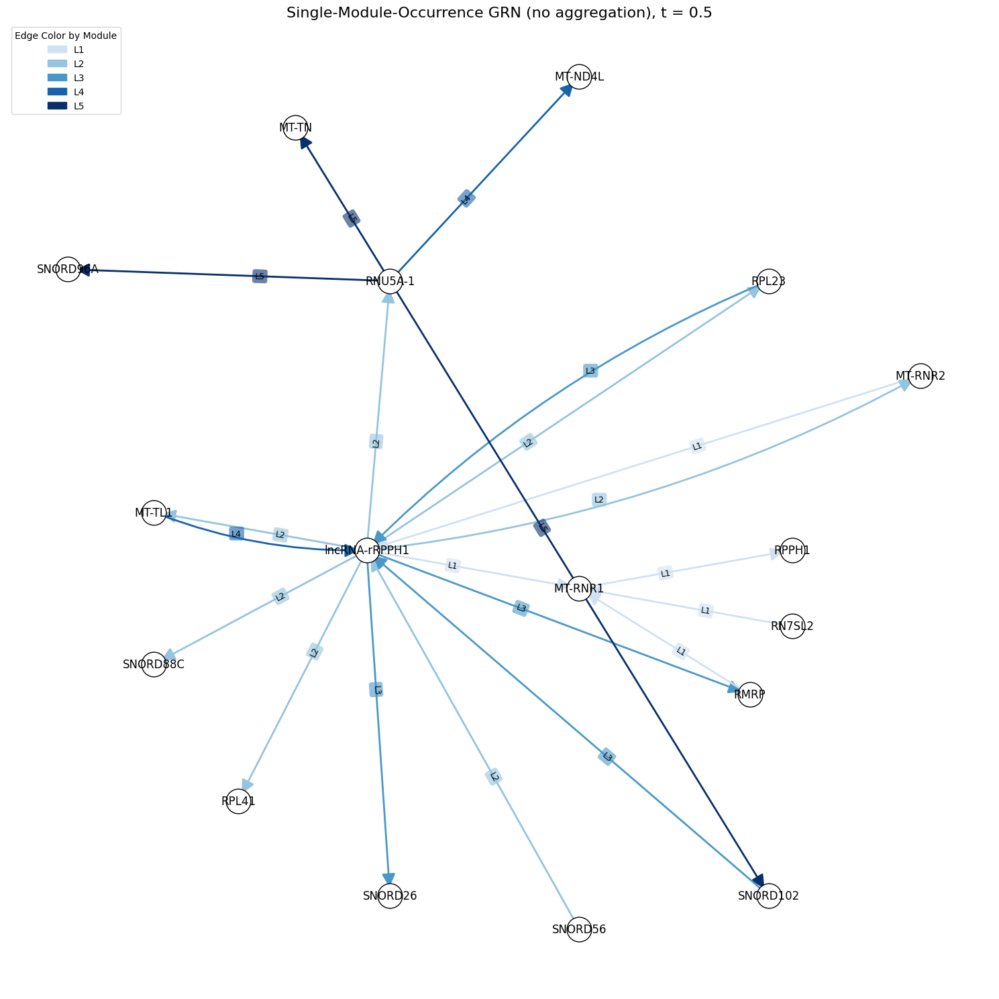

In [40]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict, Counter
from networkx.drawing.nx_agraph import graphviz_layout
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
import numpy as np

# === Load Data ===
df = pd.read_csv('/Users/irmaskaljo/codedev/thesis/Data_preprocessing/Human_coronavirus/HS_consolidated_r5_t0.25.csv')

# === Count edges and modules ===
edge_counts = Counter()
edge_modules = defaultdict(set)
for _, row in df.iterrows():
    edge = (row["Regulator"], row["TargetGene"])
    edge_counts[edge] += 1
    edge_modules[edge].add(row["Module"])

# === Filter to single-occurrence edges ===
single_edges = {e for e, c in edge_counts.items() if c == 1}
df_once = df[df.apply(lambda row: (row["Regulator"], row["TargetGene"]) in single_edges, axis=1)]

# === Build Graph ===
G = nx.DiGraph()
node_modules = defaultdict(list)
edge_modules_single = defaultdict(set)

for _, row in df_once.iterrows():
    u, v, mod = row["Regulator"], row["TargetGene"], row["Module"]
    G.add_edge(u, v)
    edge_modules_single[(u, v)].add(mod)
    node_modules[u].append(mod)
    node_modules[v].append(mod)

# === Dominant module per node ===
node_cluster = {n: Counter(mods).most_common(1)[0][0] for n, mods in node_modules.items()}

# === Color Mapping ===
all_modules = sorted({m for mods in edge_modules_single.values() for m in mods})
min_val, max_val = 0.2, 1.0
steps = len(all_modules) - 1 if len(all_modules) > 1 else 1
module_to_intensity = {
    mod: min_val + i * (max_val - min_val) / steps for i, mod in enumerate(all_modules)
}
cmap = plt.colormaps["Blues"]

# === Layout ===
try:
    candidate_nodes = [n for n in G.nodes()]
    lengths = {}

    for node in candidate_nodes:
        sp = nx.single_source_shortest_path_length(G, node)
        reachable = [t for t in sp if t != node]
        if reachable:
            avg_length = sum(sp[t] for t in reachable) / len(reachable)
            lengths[node] = avg_length

    best_root = min(lengths, key=lengths.get)
    print(f"Best root node: {best_root}")
except:
    best_root = list(G.nodes())[0]
    print("No valid root found — using fallback.")

pos = graphviz_layout(G, prog="twopi", root=best_root)

# === Create Figure ===
plt.figure(figsize=(15,15))
ax = plt.gca()

# === Draw Nodes ===
nx.draw_networkx_nodes(G, pos,
                       node_color="white",
                       edgecolors="black",
                       node_shape='o', node_size=700, ax=ax)

nx.draw_networkx_labels(G, pos,
                        labels={n: n for n in G.nodes()},
                        font_size=12, ax=ax)

# === Edge colors ===
mutual_edges = set()
for u, v in G.edges():
    if G.has_edge(v, u) and (v, u) not in mutual_edges:
        mutual_edges.add((u, v))

edge_to_color = {}
for u, v in G.edges():
    modules = sorted(edge_modules_single.get((u, v), []))
    if modules:
        avg_intensity = sum(module_to_intensity[m] for m in modules) / len(modules)
        edge_to_color[(u, v)] = cmap(avg_intensity)

# === Draw Edges ===
drawn_mutual = set()
for u, v in G.edges():
    edge_color = edge_to_color[(u, v)]
    if (v, u) in mutual_edges and (v, u) not in drawn_mutual:
        connection = 'arc3,rad=0.1'
        drawn_mutual.add((u, v))
    else:
        connection = 'arc3,rad=0.0'

    nx.draw_networkx_edges(
        G, pos, edgelist=[(u, v)],
        edge_color=[edge_color], arrows=True,
        arrowstyle='-|>', arrowsize=30, width=2,
        connectionstyle=connection, ax=ax
    )

# === Edge Labels ===
def curved_label_pos(pos_src, pos_dst, curvature=0.03, label_pos=0.4):
    dx = pos_dst[0] - pos_src[0]
    dy = pos_dst[1] - pos_src[1]
    mx = pos_src[0] + dx * label_pos
    my = pos_src[1] + dy * label_pos
    perp_dx = dy
    perp_dy = -dx
    norm = np.hypot(perp_dx, perp_dy)
    if norm == 0:
        return (mx, my)
    offset = curvature * np.sqrt(dx**2 + dy**2)
    return (mx + perp_dx / norm * offset, my + perp_dy / norm * offset)

edge_labels = {(u, v): ", ".join(sorted(mods)) for (u, v), mods in edge_modules_single.items()}
for (u, v), label in edge_labels.items():
    edge_color = edge_to_color.get((u, v), "white")
    is_curved = ((v, u) in mutual_edges)
    if is_curved:
        x, y = curved_label_pos(pos[u], pos[v], curvature=0.05, label_pos=0.4)
        ax.text(x, y, label, fontsize=9,
                bbox=dict(boxstyle='round', facecolor=edge_color, edgecolor='none', alpha=0.6),
                ha='center')
    else:
        nx.draw_networkx_edge_labels(
            G, pos,
            edge_labels={(u, v): label},
            font_size=9, label_pos=0.4,
            bbox=dict(boxstyle='round', facecolor=edge_color, edgecolor='none', alpha=0.6),
            ax=ax
        )

# === Legend ===
legend_lines = [
    Patch(color=cmap(module_to_intensity[m]), label=m) for m in all_modules
]
ax.legend(handles=legend_lines, title="Edge Color by Module", loc='upper left')

# === Final touches ===
ax.set_title("Single-Module-Occurrence GRN (no aggregation), t = 0.5", fontsize=16)
ax.axis("off")
plt.tight_layout()
plt.show()


Best root node: lncRNA-rRPPH1


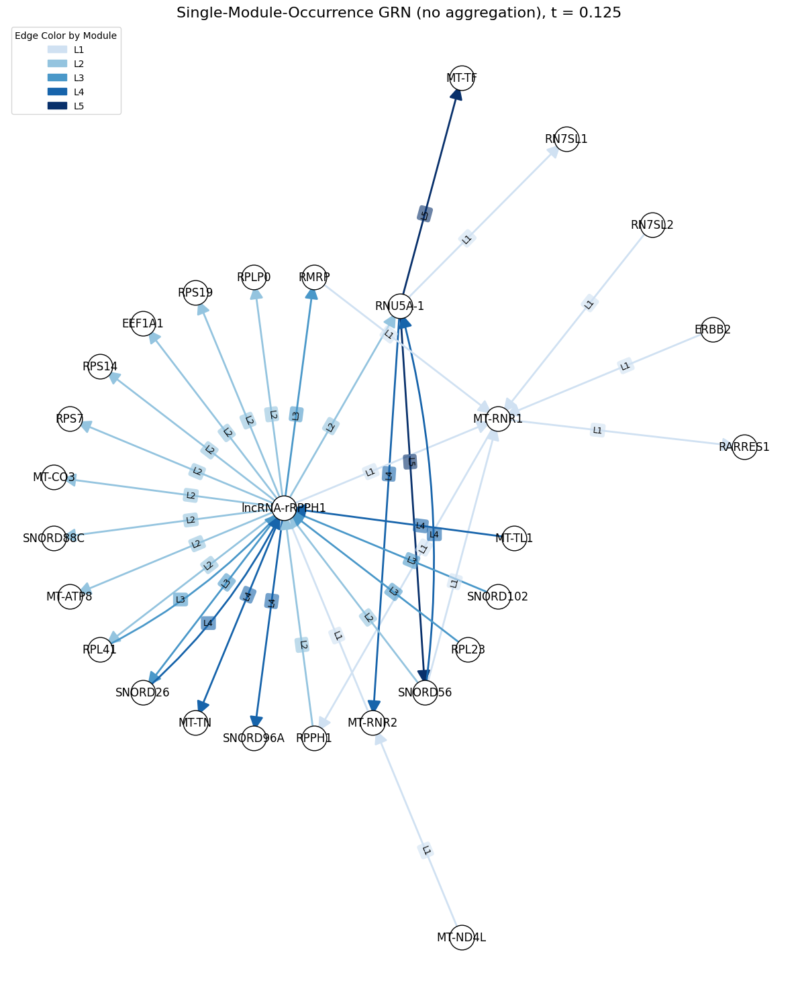

In [41]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict, Counter
from networkx.drawing.nx_agraph import graphviz_layout
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
import numpy as np

# === Load Data ===
df = pd.read_csv('/Users/irmaskaljo/codedev/thesis/Data_preprocessing/Human_coronavirus/HS_consolidated_r5_t0.125.csv')

# === Count edges and modules ===
edge_counts = Counter()
edge_modules = defaultdict(set)
for _, row in df.iterrows():
    edge = (row["Regulator"], row["TargetGene"])
    edge_counts[edge] += 1
    edge_modules[edge].add(row["Module"])

# === Filter to single-occurrence edges ===
single_edges = {e for e, c in edge_counts.items() if c == 1}
df_once = df[df.apply(lambda row: (row["Regulator"], row["TargetGene"]) in single_edges, axis=1)]

# === Build Graph ===
G = nx.DiGraph()
node_modules = defaultdict(list)
edge_modules_single = defaultdict(set)

for _, row in df_once.iterrows():
    u, v, mod = row["Regulator"], row["TargetGene"], row["Module"]
    G.add_edge(u, v)
    edge_modules_single[(u, v)].add(mod)
    node_modules[u].append(mod)
    node_modules[v].append(mod)

# === Dominant module per node ===
node_cluster = {n: Counter(mods).most_common(1)[0][0] for n, mods in node_modules.items()}

# === Color Mapping ===
all_modules = sorted({m for mods in edge_modules_single.values() for m in mods})
min_val, max_val = 0.2, 1.0
steps = len(all_modules) - 1 if len(all_modules) > 1 else 1
module_to_intensity = {
    mod: min_val + i * (max_val - min_val) / steps for i, mod in enumerate(all_modules)
}
cmap = plt.colormaps["Blues"]

# === Layout ===
try:
    candidate_nodes = [n for n in G.nodes()]
    lengths = {}

    for node in candidate_nodes:
        sp = nx.single_source_shortest_path_length(G, node)
        reachable = [t for t in sp if t != node]
        if reachable:
            avg_length = sum(sp[t] for t in reachable) / len(reachable)
            lengths[node] = avg_length

    best_root = min(lengths, key=lengths.get)
    print(f"Best root node: {best_root}")
except:
    best_root = list(G.nodes())[0]
    print("No valid root found — using fallback.")

pos = graphviz_layout(G, prog="twopi", root=best_root)

# === Create Figure ===
plt.figure(figsize=(12,15))
ax = plt.gca()

# === Draw Nodes ===
nx.draw_networkx_nodes(G, pos,
                       node_color="white",
                       edgecolors="black",
                       node_shape='o', node_size=700, ax=ax)

nx.draw_networkx_labels(G, pos,
                        labels={n: n for n in G.nodes()},
                        font_size=12, ax=ax)

# === Edge colors ===
mutual_edges = set()
for u, v in G.edges():
    if G.has_edge(v, u) and (v, u) not in mutual_edges:
        mutual_edges.add((u, v))

edge_to_color = {}
for u, v in G.edges():
    modules = sorted(edge_modules_single.get((u, v), []))
    if modules:
        avg_intensity = sum(module_to_intensity[m] for m in modules) / len(modules)
        edge_to_color[(u, v)] = cmap(avg_intensity)

# === Draw Edges ===
drawn_mutual = set()
for u, v in G.edges():
    edge_color = edge_to_color[(u, v)]
    if (v, u) in mutual_edges and (v, u) not in drawn_mutual:
        connection = 'arc3,rad=0.1'
        drawn_mutual.add((u, v))
    else:
        connection = 'arc3,rad=0.0'

    nx.draw_networkx_edges(
        G, pos, edgelist=[(u, v)],
        edge_color=[edge_color], arrows=True,
        arrowstyle='-|>', arrowsize=30, width=2,
        connectionstyle=connection, ax=ax
    )

# === Edge Labels ===
def curved_label_pos(pos_src, pos_dst, curvature=0.03, label_pos=0.4):
    dx = pos_dst[0] - pos_src[0]
    dy = pos_dst[1] - pos_src[1]
    mx = pos_src[0] + dx * label_pos
    my = pos_src[1] + dy * label_pos
    perp_dx = dy
    perp_dy = -dx
    norm = np.hypot(perp_dx, perp_dy)
    if norm == 0:
        return (mx, my)
    offset = curvature * np.sqrt(dx**2 + dy**2)
    return (mx + perp_dx / norm * offset, my + perp_dy / norm * offset)

edge_labels = {(u, v): ", ".join(sorted(mods)) for (u, v), mods in edge_modules_single.items()}
for (u, v), label in edge_labels.items():
    edge_color = edge_to_color.get((u, v), "white")
    is_curved = ((v, u) in mutual_edges)
    if is_curved:
        x, y = curved_label_pos(pos[u], pos[v], curvature=0.05, label_pos=0.4)
        ax.text(x, y, label, fontsize=9,
                bbox=dict(boxstyle='round', facecolor=edge_color, edgecolor='none', alpha=0.6),
                ha='center')
    else:
        nx.draw_networkx_edge_labels(
            G, pos,
            edge_labels={(u, v): label},
            font_size=9, label_pos=0.4,
            bbox=dict(boxstyle='round', facecolor=edge_color, edgecolor='none', alpha=0.6),
            ax=ax
        )

# === Legend ===
legend_lines = [
    Patch(color=cmap(module_to_intensity[m]), label=m) for m in all_modules
]
ax.legend(handles=legend_lines, title="Edge Color by Module", loc='upper left')

# === Final touches ===
ax.set_title("Single-Module-Occurrence GRN (no aggregation), t = 0.125", fontsize=16)
ax.axis("off")
plt.tight_layout()
plt.show()


Best root node: lncRNA-rRPPH1


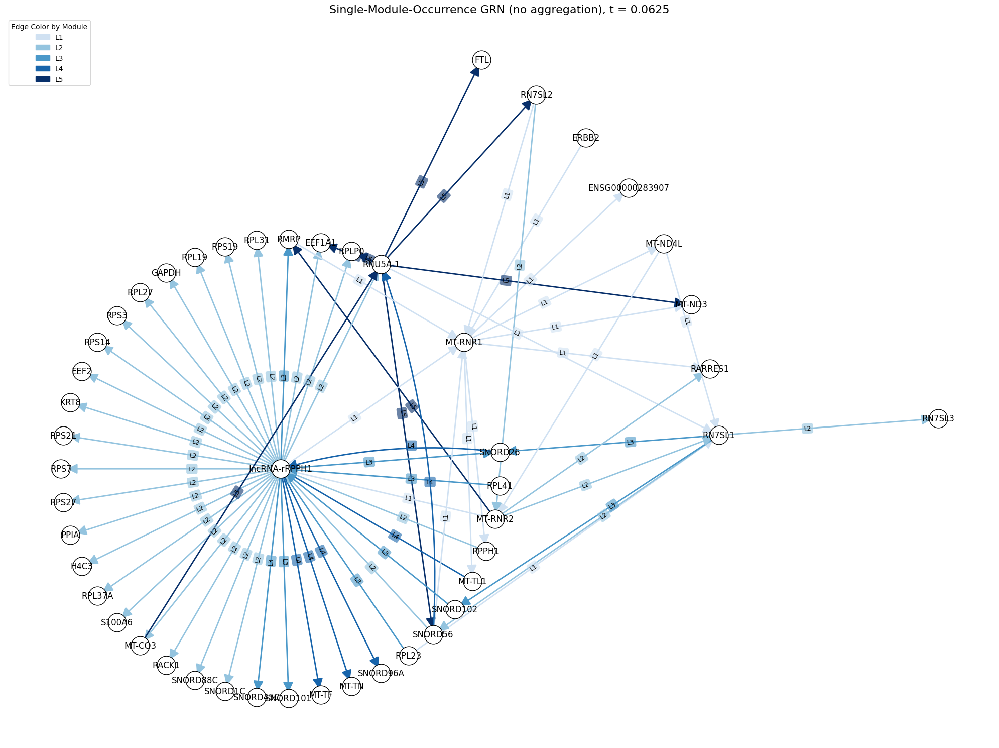

In [42]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict, Counter
from networkx.drawing.nx_agraph import graphviz_layout
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
import numpy as np

# === Load Data ===
df = pd.read_csv('/Users/irmaskaljo/codedev/thesis/Data_preprocessing/Human_coronavirus/HS_consolidated_r5_t0.0625.csv')

# === Count edges and modules ===
edge_counts = Counter()
edge_modules = defaultdict(set)
for _, row in df.iterrows():
    edge = (row["Regulator"], row["TargetGene"])
    edge_counts[edge] += 1
    edge_modules[edge].add(row["Module"])

# === Filter to single-occurrence edges ===
single_edges = {e for e, c in edge_counts.items() if c == 1}
df_once = df[df.apply(lambda row: (row["Regulator"], row["TargetGene"]) in single_edges, axis=1)]

# === Build Graph ===
G = nx.DiGraph()
node_modules = defaultdict(list)
edge_modules_single = defaultdict(set)

for _, row in df_once.iterrows():
    u, v, mod = row["Regulator"], row["TargetGene"], row["Module"]
    G.add_edge(u, v)
    edge_modules_single[(u, v)].add(mod)
    node_modules[u].append(mod)
    node_modules[v].append(mod)

# === Dominant module per node ===
node_cluster = {n: Counter(mods).most_common(1)[0][0] for n, mods in node_modules.items()}

# === Color Mapping ===
all_modules = sorted({m for mods in edge_modules_single.values() for m in mods})
min_val, max_val = 0.2, 1.0
steps = len(all_modules) - 1 if len(all_modules) > 1 else 1
module_to_intensity = {
    mod: min_val + i * (max_val - min_val) / steps for i, mod in enumerate(all_modules)
}
cmap = plt.colormaps["Blues"]

# === Layout ===
try:
    candidate_nodes = [n for n in G.nodes()]
    lengths = {}

    for node in candidate_nodes:
        sp = nx.single_source_shortest_path_length(G, node)
        reachable = [t for t in sp if t != node]
        if reachable:
            avg_length = sum(sp[t] for t in reachable) / len(reachable)
            lengths[node] = avg_length

    best_root = min(lengths, key=lengths.get)
    print(f"Best root node: {best_root}")
except:
    best_root = list(G.nodes())[0]
    print("No valid root found — using fallback.")

pos = graphviz_layout(G, prog="twopi", root=best_root)

# === Create Figure ===
plt.figure(figsize=(20,15))
ax = plt.gca()

# === Draw Nodes ===
nx.draw_networkx_nodes(G, pos,
                       node_color="white",
                       edgecolors="black",
                       node_shape='o', node_size=700, ax=ax)

nx.draw_networkx_labels(G, pos,
                        labels={n: n for n in G.nodes()},
                        font_size=12, ax=ax)

# === Edge colors ===
mutual_edges = set()
for u, v in G.edges():
    if G.has_edge(v, u) and (v, u) not in mutual_edges:
        mutual_edges.add((u, v))

edge_to_color = {}
for u, v in G.edges():
    modules = sorted(edge_modules_single.get((u, v), []))
    if modules:
        avg_intensity = sum(module_to_intensity[m] for m in modules) / len(modules)
        edge_to_color[(u, v)] = cmap(avg_intensity)

# === Draw Edges ===
drawn_mutual = set()
for u, v in G.edges():
    edge_color = edge_to_color[(u, v)]
    if (v, u) in mutual_edges and (v, u) not in drawn_mutual:
        connection = 'arc3,rad=0.1'
        drawn_mutual.add((u, v))
    else:
        connection = 'arc3,rad=0.0'

    nx.draw_networkx_edges(
        G, pos, edgelist=[(u, v)],
        edge_color=[edge_color], arrows=True,
        arrowstyle='-|>', arrowsize=30, width=2,
        connectionstyle=connection, ax=ax
    )

# === Edge Labels ===
def curved_label_pos(pos_src, pos_dst, curvature=0.03, label_pos=0.4):
    dx = pos_dst[0] - pos_src[0]
    dy = pos_dst[1] - pos_src[1]
    mx = pos_src[0] + dx * label_pos
    my = pos_src[1] + dy * label_pos
    perp_dx = dy
    perp_dy = -dx
    norm = np.hypot(perp_dx, perp_dy)
    if norm == 0:
        return (mx, my)
    offset = curvature * np.sqrt(dx**2 + dy**2)
    return (mx + perp_dx / norm * offset, my + perp_dy / norm * offset)

edge_labels = {(u, v): ", ".join(sorted(mods)) for (u, v), mods in edge_modules_single.items()}
for (u, v), label in edge_labels.items():
    edge_color = edge_to_color.get((u, v), "white")
    is_curved = ((v, u) in mutual_edges)
    if is_curved:
        x, y = curved_label_pos(pos[u], pos[v], curvature=0.05, label_pos=0.4)
        ax.text(x, y, label, fontsize=9,
                bbox=dict(boxstyle='round', facecolor=edge_color, edgecolor='none', alpha=0.6),
                ha='center')
    else:
        nx.draw_networkx_edge_labels(
            G, pos,
            edge_labels={(u, v): label},
            font_size=9, label_pos=0.4,
            bbox=dict(boxstyle='round', facecolor=edge_color, edgecolor='none', alpha=0.6),
            ax=ax
        )

# === Legend ===
legend_lines = [
    Patch(color=cmap(module_to_intensity[m]), label=m) for m in all_modules
]
ax.legend(handles=legend_lines, title="Edge Color by Module", loc='upper left')

# === Final touches ===
ax.set_title("Single-Module-Occurrence GRN (no aggregation), t = 0.0625", fontsize=16)
ax.axis("off")
plt.tight_layout()
plt.show()


Best root node: lncRNA-rRPPH1


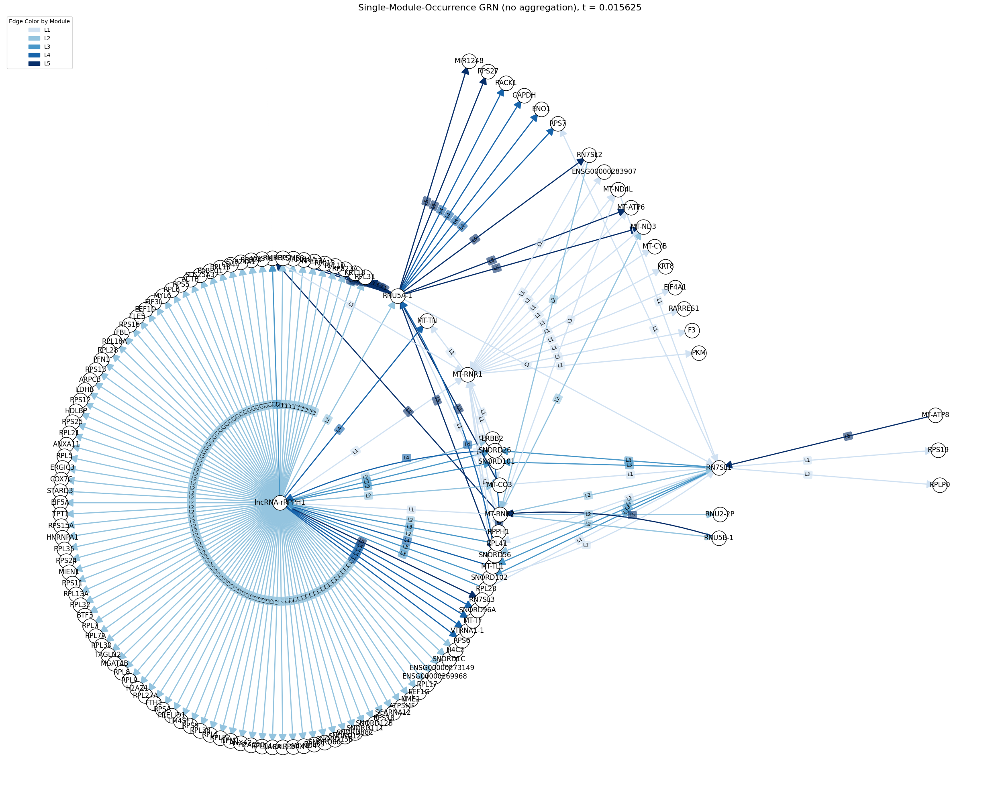

In [43]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict, Counter
from networkx.drawing.nx_agraph import graphviz_layout
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
import numpy as np

# === Load Data ===
df = pd.read_csv('/Users/irmaskaljo/codedev/thesis/Data_preprocessing/Human_coronavirus/HS_consolidated_r5_t0.015625.csv')

# === Count edges and modules ===
edge_counts = Counter()
edge_modules = defaultdict(set)
for _, row in df.iterrows():
    edge = (row["Regulator"], row["TargetGene"])
    edge_counts[edge] += 1
    edge_modules[edge].add(row["Module"])

# === Filter to single-occurrence edges ===
single_edges = {e for e, c in edge_counts.items() if c == 1}
df_once = df[df.apply(lambda row: (row["Regulator"], row["TargetGene"]) in single_edges, axis=1)]

# === Build Graph ===
G = nx.DiGraph()
node_modules = defaultdict(list)
edge_modules_single = defaultdict(set)

for _, row in df_once.iterrows():
    u, v, mod = row["Regulator"], row["TargetGene"], row["Module"]
    G.add_edge(u, v)
    edge_modules_single[(u, v)].add(mod)
    node_modules[u].append(mod)
    node_modules[v].append(mod)

# === Dominant module per node ===
node_cluster = {n: Counter(mods).most_common(1)[0][0] for n, mods in node_modules.items()}

# === Color Mapping ===
all_modules = sorted({m for mods in edge_modules_single.values() for m in mods})
min_val, max_val = 0.2, 1.0
steps = len(all_modules) - 1 if len(all_modules) > 1 else 1
module_to_intensity = {
    mod: min_val + i * (max_val - min_val) / steps for i, mod in enumerate(all_modules)
}
cmap = plt.colormaps["Blues"]

# === Layout ===
try:
    candidate_nodes = [n for n in G.nodes()]
    lengths = {}

    for node in candidate_nodes:
        sp = nx.single_source_shortest_path_length(G, node)
        reachable = [t for t in sp if t != node]
        if reachable:
            avg_length = sum(sp[t] for t in reachable) / len(reachable)
            lengths[node] = avg_length

    best_root = min(lengths, key=lengths.get)
    print(f"Best root node: {best_root}")
except:
    best_root = list(G.nodes())[0]
    print("No valid root found — using fallback.")

pos = graphviz_layout(G, prog="twopi", root=best_root)

# === Create Figure ===
plt.figure(figsize=(25, 20))
ax = plt.gca()

# === Draw Nodes ===
nx.draw_networkx_nodes(G, pos,
                       node_color="white",
                       edgecolors="black",
                       node_shape='o', node_size=700, ax=ax)

nx.draw_networkx_labels(G, pos,
                        labels={n: n for n in G.nodes()},
                        font_size=12, ax=ax)

# === Edge colors ===
mutual_edges = set()
for u, v in G.edges():
    if G.has_edge(v, u) and (v, u) not in mutual_edges:
        mutual_edges.add((u, v))

edge_to_color = {}
for u, v in G.edges():
    modules = sorted(edge_modules_single.get((u, v), []))
    if modules:
        avg_intensity = sum(module_to_intensity[m] for m in modules) / len(modules)
        edge_to_color[(u, v)] = cmap(avg_intensity)

# === Draw Edges ===
drawn_mutual = set()
for u, v in G.edges():
    edge_color = edge_to_color[(u, v)]
    if (v, u) in mutual_edges and (v, u) not in drawn_mutual:
        connection = 'arc3,rad=0.1'
        drawn_mutual.add((u, v))
    else:
        connection = 'arc3,rad=0.0'

    nx.draw_networkx_edges(
        G, pos, edgelist=[(u, v)],
        edge_color=[edge_color], arrows=True,
        arrowstyle='-|>', arrowsize=30, width=2,
        connectionstyle=connection, ax=ax
    )

# === Edge Labels ===
def curved_label_pos(pos_src, pos_dst, curvature=0.03, label_pos=0.4):
    dx = pos_dst[0] - pos_src[0]
    dy = pos_dst[1] - pos_src[1]
    mx = pos_src[0] + dx * label_pos
    my = pos_src[1] + dy * label_pos
    perp_dx = dy
    perp_dy = -dx
    norm = np.hypot(perp_dx, perp_dy)
    if norm == 0:
        return (mx, my)
    offset = curvature * np.sqrt(dx**2 + dy**2)
    return (mx + perp_dx / norm * offset, my + perp_dy / norm * offset)

edge_labels = {(u, v): ", ".join(sorted(mods)) for (u, v), mods in edge_modules_single.items()}
for (u, v), label in edge_labels.items():
    edge_color = edge_to_color.get((u, v), "white")
    is_curved = ((v, u) in mutual_edges)
    if is_curved:
        x, y = curved_label_pos(pos[u], pos[v], curvature=0.05, label_pos=0.4)
        ax.text(x, y, label, fontsize=9,
                bbox=dict(boxstyle='round', facecolor=edge_color, edgecolor='none', alpha=0.6),
                ha='center')
    else:
        nx.draw_networkx_edge_labels(
            G, pos,
            edge_labels={(u, v): label},
            font_size=9, label_pos=0.4,
            bbox=dict(boxstyle='round', facecolor=edge_color, edgecolor='none', alpha=0.6),
            ax=ax
        )

# === Legend ===
legend_lines = [
    Patch(color=cmap(module_to_intensity[m]), label=m) for m in all_modules
]
ax.legend(handles=legend_lines, title="Edge Color by Module", loc='upper left')

# === Final touches ===
ax.set_title("Single-Module-Occurrence GRN (no aggregation), t = 0.015625", fontsize=16)
ax.axis("off")
plt.tight_layout()
plt.show()


Best root node: lncRNA-rRPPH1


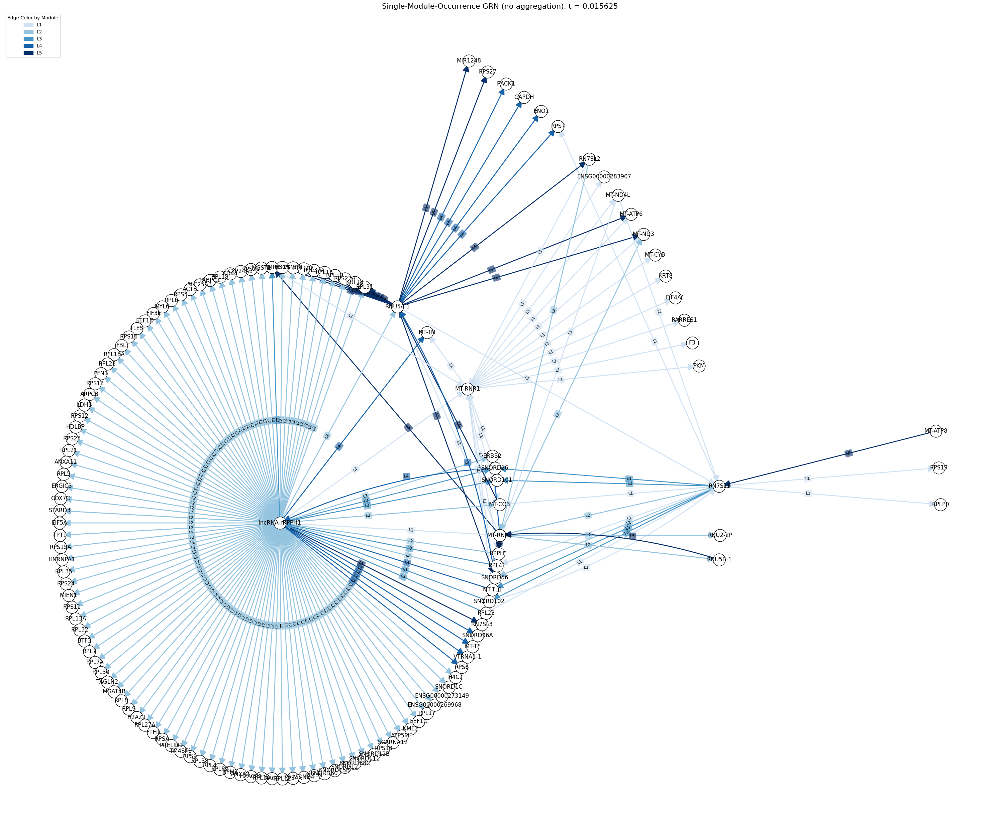

In [44]:
# increasing figure size for better visibility
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict, Counter
from networkx.drawing.nx_agraph import graphviz_layout
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
import numpy as np

# === Load Data ===
df = pd.read_csv('/Users/irmaskaljo/codedev/thesis/Data_preprocessing/Human_coronavirus/HS_consolidated_r5_t0.015625.csv')

# === Count edges and modules ===
edge_counts = Counter()
edge_modules = defaultdict(set)
for _, row in df.iterrows():
    edge = (row["Regulator"], row["TargetGene"])
    edge_counts[edge] += 1
    edge_modules[edge].add(row["Module"])

# === Filter to single-occurrence edges ===
single_edges = {e for e, c in edge_counts.items() if c == 1}
df_once = df[df.apply(lambda row: (row["Regulator"], row["TargetGene"]) in single_edges, axis=1)]

# === Build Graph ===
G = nx.DiGraph()
node_modules = defaultdict(list)
edge_modules_single = defaultdict(set)

for _, row in df_once.iterrows():
    u, v, mod = row["Regulator"], row["TargetGene"], row["Module"]
    G.add_edge(u, v)
    edge_modules_single[(u, v)].add(mod)
    node_modules[u].append(mod)
    node_modules[v].append(mod)

# === Dominant module per node ===
node_cluster = {n: Counter(mods).most_common(1)[0][0] for n, mods in node_modules.items()}

# === Color Mapping ===
all_modules = sorted({m for mods in edge_modules_single.values() for m in mods})
min_val, max_val = 0.2, 1.0
steps = len(all_modules) - 1 if len(all_modules) > 1 else 1
module_to_intensity = {
    mod: min_val + i * (max_val - min_val) / steps for i, mod in enumerate(all_modules)
}
cmap = plt.colormaps["Blues"]

# === Layout ===
try:
    candidate_nodes = [n for n in G.nodes()]
    lengths = {}

    for node in candidate_nodes:
        sp = nx.single_source_shortest_path_length(G, node)
        reachable = [t for t in sp if t != node]
        if reachable:
            avg_length = sum(sp[t] for t in reachable) / len(reachable)
            lengths[node] = avg_length

    best_root = min(lengths, key=lengths.get)
    print(f"Best root node: {best_root}")
except:
    best_root = list(G.nodes())[0]
    print("No valid root found — using fallback.")

pos = graphviz_layout(G, prog="twopi", root=best_root)

# === Create Figure ===
plt.figure(figsize=(30, 25))
ax = plt.gca()

# === Draw Nodes ===
nx.draw_networkx_nodes(G, pos,
                       node_color="white",
                       edgecolors="black",
                       node_shape='o', node_size=700, ax=ax)

nx.draw_networkx_labels(G, pos,
                        labels={n: n for n in G.nodes()},
                        font_size=12, ax=ax)

# === Edge colors ===
mutual_edges = set()
for u, v in G.edges():
    if G.has_edge(v, u) and (v, u) not in mutual_edges:
        mutual_edges.add((u, v))

edge_to_color = {}
for u, v in G.edges():
    modules = sorted(edge_modules_single.get((u, v), []))
    if modules:
        avg_intensity = sum(module_to_intensity[m] for m in modules) / len(modules)
        edge_to_color[(u, v)] = cmap(avg_intensity)

# === Draw Edges ===
drawn_mutual = set()
for u, v in G.edges():
    edge_color = edge_to_color[(u, v)]
    if (v, u) in mutual_edges and (v, u) not in drawn_mutual:
        connection = 'arc3,rad=0.1'
        drawn_mutual.add((u, v))
    else:
        connection = 'arc3,rad=0.0'

    nx.draw_networkx_edges(
        G, pos, edgelist=[(u, v)],
        edge_color=[edge_color], arrows=True,
        arrowstyle='-|>', arrowsize=30, width=2,
        connectionstyle=connection, ax=ax
    )

# === Edge Labels ===
def curved_label_pos(pos_src, pos_dst, curvature=0.03, label_pos=0.4):
    dx = pos_dst[0] - pos_src[0]
    dy = pos_dst[1] - pos_src[1]
    mx = pos_src[0] + dx * label_pos
    my = pos_src[1] + dy * label_pos
    perp_dx = dy
    perp_dy = -dx
    norm = np.hypot(perp_dx, perp_dy)
    if norm == 0:
        return (mx, my)
    offset = curvature * np.sqrt(dx**2 + dy**2)
    return (mx + perp_dx / norm * offset, my + perp_dy / norm * offset)

edge_labels = {(u, v): ", ".join(sorted(mods)) for (u, v), mods in edge_modules_single.items()}
for (u, v), label in edge_labels.items():
    edge_color = edge_to_color.get((u, v), "white")
    is_curved = ((v, u) in mutual_edges)
    if is_curved:
        x, y = curved_label_pos(pos[u], pos[v], curvature=0.05, label_pos=0.4)
        ax.text(x, y, label, fontsize=9,
                bbox=dict(boxstyle='round', facecolor=edge_color, edgecolor='none', alpha=0.6),
                ha='center')
    else:
        nx.draw_networkx_edge_labels(
            G, pos,
            edge_labels={(u, v): label},
            font_size=9, label_pos=0.4,
            bbox=dict(boxstyle='round', facecolor=edge_color, edgecolor='none', alpha=0.6),
            ax=ax
        )

# === Legend ===
legend_lines = [
    Patch(color=cmap(module_to_intensity[m]), label=m) for m in all_modules
]
ax.legend(handles=legend_lines, title="Edge Color by Module", loc='upper left')

# === Final touches ===
ax.set_title("Single-Module-Occurrence GRN (no aggregation), t = 0.015625", fontsize=16)
ax.axis("off")
plt.tight_layout()
plt.show()


In [45]:
import pandas as pd
import networkx as nx
df = pd.read_csv('/Users/irmaskaljo/codedev/thesis/Data_preprocessing/Human_coronavirus/HS_consolidated_r5_t0.015625.csv')
#create a graph only for module L2 and count nodes and edges

G = nx.MultiDiGraph()
for _, row in df.iterrows():
    if row["Module"] == "L2":
        G.add_edge(row["Regulator"], row["TargetGene"])
print(f"Number of nodes in module L2: {G.number_of_nodes()}")
print(f"Number of edges in module L2: {G.number_of_edges()}")

Number of nodes in module L2: 147
Number of edges in module L2: 152


In [46]:
# count 

In [47]:
df = pd.read_csv('/Users/irmaskaljo/codedev/thesis/Data_preprocessing/Yeast/scr_size_10/Yeast_consolidated_scr10_r5_t0.01.csv')
G = nx.MultiDiGraph()
for _, row in df.iterrows():
    if row["Module"] == 7:
        G.add_edge(row["Regulator"], row["TargetGene"])
print(f"Number of nodes in module 1: {G.number_of_nodes()}")
print(f"Number of edges in module 1: {G.number_of_edges()}")

Number of nodes in module 1: 239
Number of edges in module 1: 827
